This Python notebook describes batch correction and data harmonization steps in the analysis of the RNA-seq/WES datasets included in the manuscript entitled “Integrated tumor exome and transcriptome analyses reveal conserved pan-cancer microenvironment subtypes predictive of response to immunotherapy”, including analysis of sequencing batch effects, additional data quality control, and confirmation of data reported from same patient.

Results of the analysis could be also browsed at https://science.bostongene.com/tumor-portrait/

# Include initial python packages 

In [148]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
# %config IPCompleter.use_jedi = False
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib
import networkx as nx
import copy
import sys
from glob import glob
import os
import pandas as pd
from scipy.stats import norm
import numpy as np
import matplotlib.pyplot as plt
import math
from pathlib import Path
import seaborn as sns
from IPython.display import display
import joblib
from tqdm import tqdm_notebook
import warnings

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Define additional parameters

In [149]:
import warnings
warnings.filterwarnings('ignore')

%config InlineBackend.figure_format = 'png'
plt.rcParams['pdf.fonttype'] = 'truetype'
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['figure.dpi'] = 120

In [150]:
from portraits.utils import GeneSet, read_gene_sets, median_scale, ssgsea_formula, pivot_vectors
from portraits.utils import read_dataset, to_common_samples, item_series, cut_clustermap_tree
from portraits.clustering import gen_graph2
from portraits.plotting import clustering_heatmap, pca_plot, lin_colors, axis_net, patch_plot, draw_graph

In [29]:
default_cmap = matplotlib.cm.coolwarm
default_r_cmap = matplotlib.cm.coolwarm_r
single_color_cmap = sns.cubehelix_palette(as_cmap=True, light=0.97)

red_color = '#b40426'
l_red_color = '#f7607d'
blue_color = '#3b4cc0'
l_blue_color = '#8190f4'
green_color = '#229954'
orange_color = '#F0440D'
taupe_color = '#F8C471'
lgrey_color = '#AAAAAA'
dgrey_color = '#ccccff'
dblue_color = '#0000FF'
dl_blue_color = '#064B85'
purple_color = '#9933ff'
cyan_color = '#11D4FA'
fangipani_color = '#FAD7A0'
pink_color = '#F05EA0'
yellow_color = '#e2db00'
black_color = '#000000'
white_color = '#ffffff'


In [152]:
sns.set_style('white')

In [202]:
basedir = '.'

# Add list of Gene Signatures

In [14]:
immuno_gmt = read_gene_sets(basedir + 'signatures.gmt')
len(immuno_gmt)

29

In [180]:
signatures_order = ['Angiogenesis',
 'Endothelium',
 'CAF',
 'Matrix',
 'Matrix_remodeling',
 'Protumor_cytokines',
 'Neutrophil_signature',
 'Granulocyte_traffic',
 'Macrophages',
 'Macrophage_DC_traffic',
 'MDSC_traffic',
 'MDSC',
 'Th2_signature',
 'T_reg_traffic',
 'Treg',
 'M1_signatures',
 'MHCII',
 'Antitumor_cytokines',
 'Coactivation_molecules',
 'B_cells',
 'NK_cells',
 'Checkpoint_inhibition',
 'Effector_cells',
 'T_cells',
 'Th1_signature',
 'T_cell_traffic',
 'MHCI',
 'EMT_signature',
 'Proliferation_rate']

# Upload expression data

TCGA project expression data were obtained from the <a href="https://xenabrowser.net/datapages/?dataset=tcga_Kallisto_tpm&host=https%3A%2F%2Ftoil.xenahubs.net">XENA portal</a>, <a href="https://github.com/BD2KGenomics/toil-scripts/tree/toil-recompute/src/toil_scripts/rnaseq_cgl">github</a>. <br> All other RNA-seq datasets (except Liu et al. and Lauss et al.) were processed from raw files as previously described (https://doi.org/10.1038/nbt.3772) utilizing the same pipeline. Samples with low coverage (< 10M protein coding reads were excluded).

In [44]:
pan_ann = read_dataset(basedir + '/pan_ann.tsv').dropna(subset=['Transcriptomics'])
display(pan_ann.shape)
# pan_ann = pan_ann[pan_ann.QC.isna()]
pan_ann.shape

(2066, 146)

(2066, 146)

In [45]:
dm_datasets = list(pan_ann.Cohort.value_counts().index)
len(dm_datasets)

24

In [18]:
exp_path = basedir + '/{}/expressions.tsv.gz'

# Read gene expression. 
Perform simple Quality Control by analysis of gene expression distribution for each dataset

Organize all datasets into folder structure like that<br>
-Cohort1<br>
--------expressions.tsv.gz<br>
-Cohort2<br>
--------expressions.tsv.gz<br>

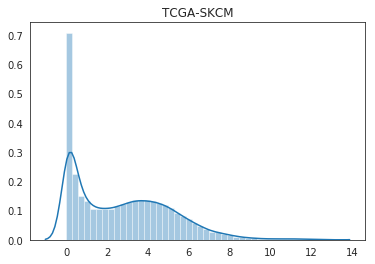

TCGA-SKCM (462, 146) (462, 20062)


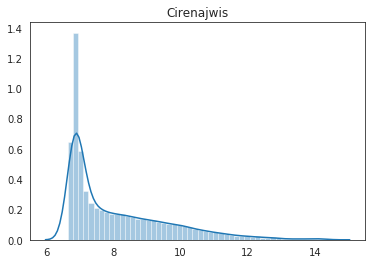

Cirenajwis (214, 146) (214, 20692)


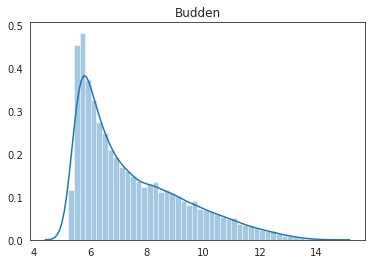

Budden (126, 146) (126, 18402)


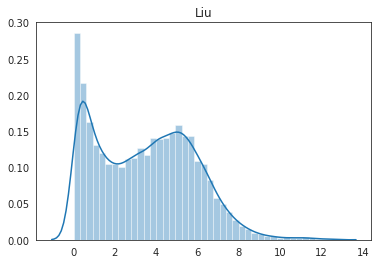

Liu (115, 146) (115, 16942)


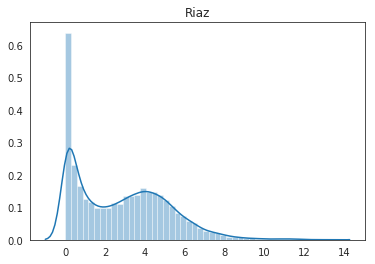

Riaz (109, 146) (109, 20062)


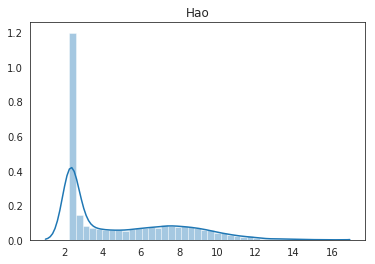

Hao (97, 146) (97, 24442)


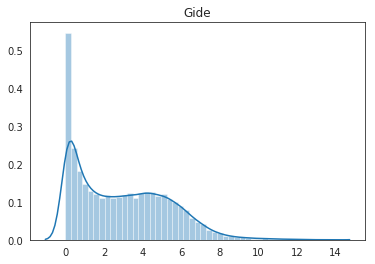

Gide (91, 146) (91, 20062)


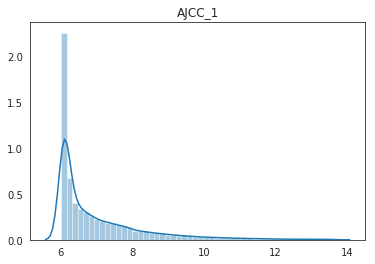

AJCC_1 (85, 146) (85, 19138)


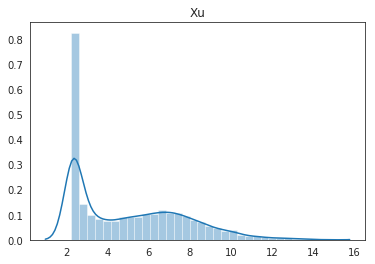

Xu (83, 146) (83, 13394)


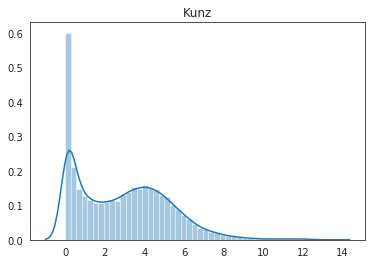

Kunz (56, 146) (56, 20062)


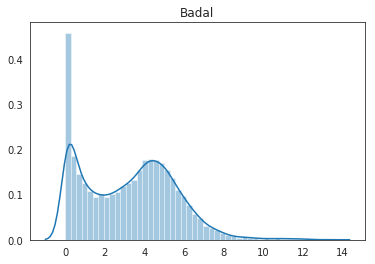

Badal (51, 146) (51, 20062)


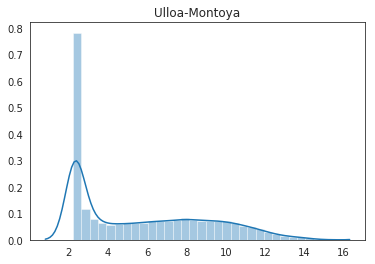

Ulloa-Montoya (65, 146) (65, 24442)


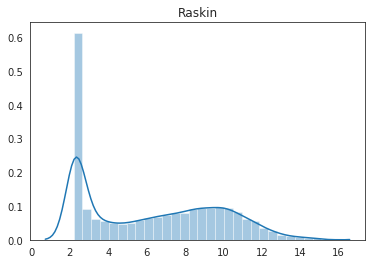

Raskin (58, 146) (58, 24442)


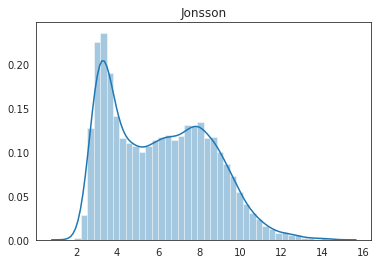

Jonsson (56, 146) (56, 18142)


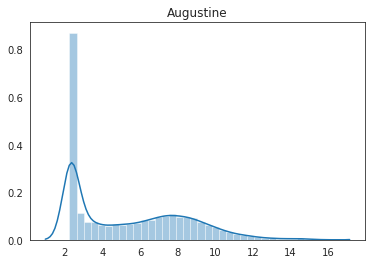

Augustine (52, 146) (52, 24442)


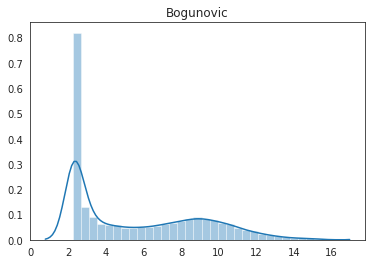

Bogunovic (44, 146) (44, 24442)


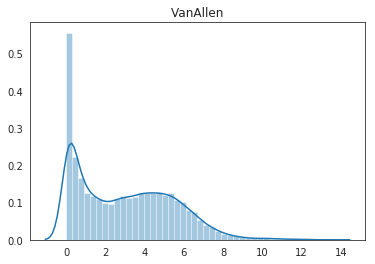

VanAllen (42, 146) (42, 20062)


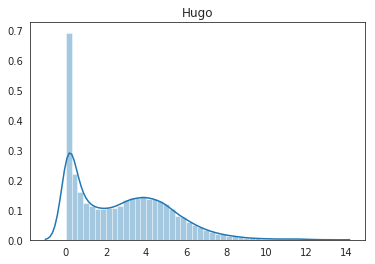

Hugo (37, 146) (37, 20062)


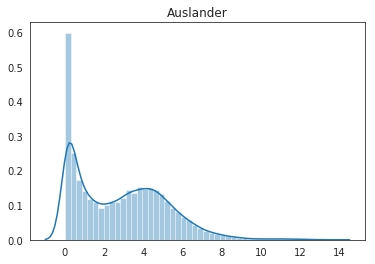

Auslander (37, 146) (37, 20062)


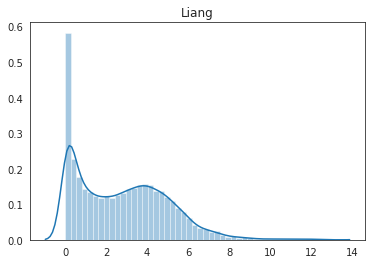

Liang (35, 146) (35, 20062)


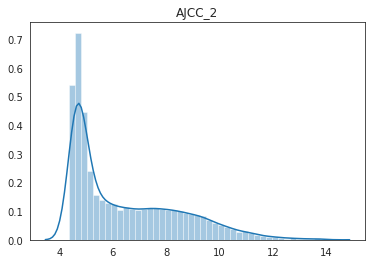

AJCC_2 (27, 146) (27, 20692)


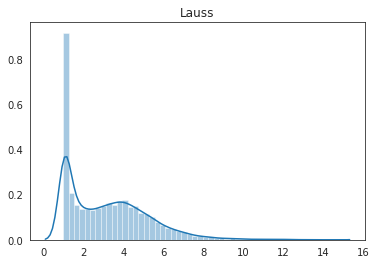

Lauss (25, 146) (25, 18418)


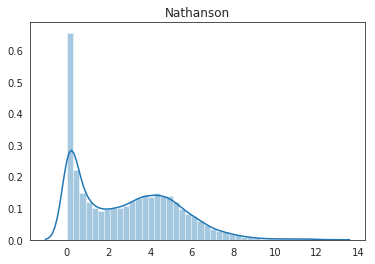

Nathanson (24, 146) (24, 20062)


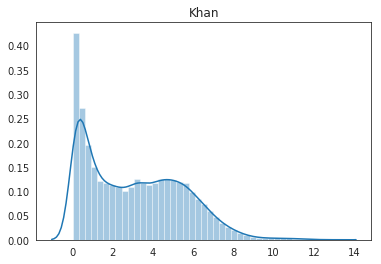

Khan (17, 146) (17, 20062)



In [21]:
dm_genes_dst = {}

for cds in tqdm_notebook(dm_datasets):
    cann = pan_ann[pan_ann.Cohort==cds]
    
    cgenes = read_dataset(exp_path.format(cds)).T
    cann, cgenes = to_common_samples([cann, cgenes])
    if cgenes.mean().max()>20:
        cgenes = np.log2(1+cgenes)
    
    ax = sns.distplot(cgenes.mean())
    ax.set_title(cds)
    plt.show()
    
    dm_genes_dst[cds] = cgenes
    print(cds, cann.shape, cgenes.shape)

# Additional Quality Control of RNA-seq cohorts

## Cohorts without mislabeled or questionable samples


* TCGA-SKCM
* Cirenajwis et al.     GSE65904	PMID: 25909218
* Budden et al. GSE59455	PMID: 27487145
* Liu et al. phs001036	PMID: 31792460
* Gide et al. ERP105482	PMID: 30753825
* Badal et al. GSE98394	PMID: 28469092
* Ulloa-Montoya et al. GSE35640	PMID: 23715562
* Augustine et al. GSE19293	PMID: 20371714
* Bogunovic et al. GSE19234	PMID: 19915147
* Laus et al. GSE100797	PMID: 29170503
* Nathanson et al. SRP067586	PMID: 27956380

In [22]:
OK_cohorts = ['TCGA-SKCM',
 'Cirenajwis',
 'Budden',
 'Liu',
 'Gide',
 'Badal',
 'Ulloa-Montoya',
 'Augustine',
 'Bogunovic',
 'Lauss',
 'Nathanson']

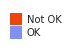

In [51]:
qc_ok_p = {True: orange_color, False: l_blue_color}
patch_plot({'Not OK': orange_color, 'OK': l_blue_color})

## Perform PCA/gene expression correlation analysis to reveal outliers

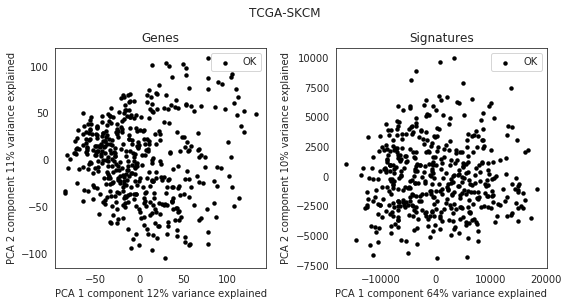

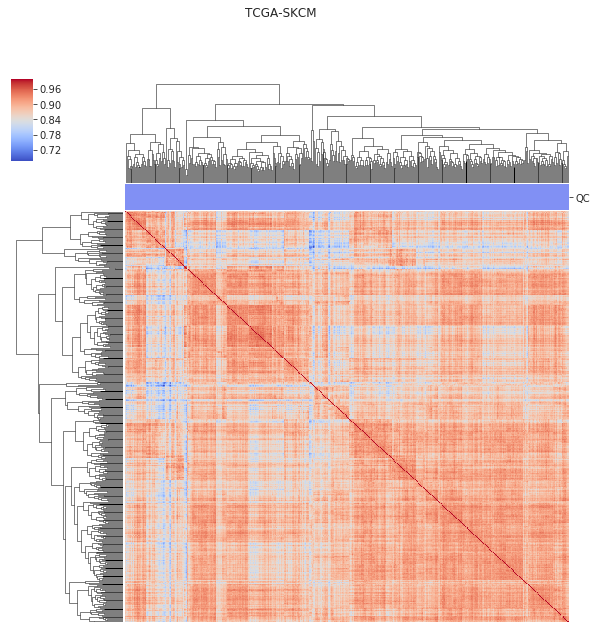

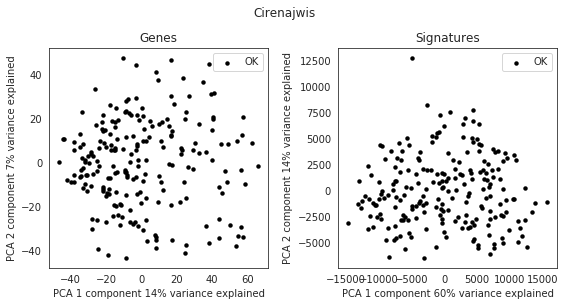

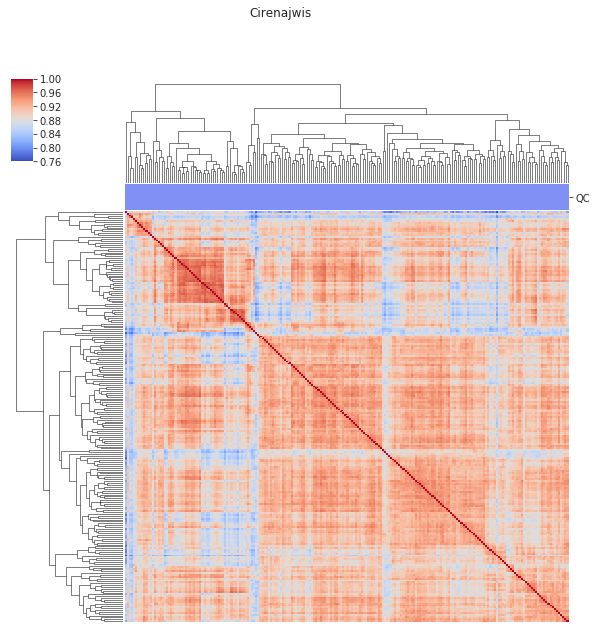

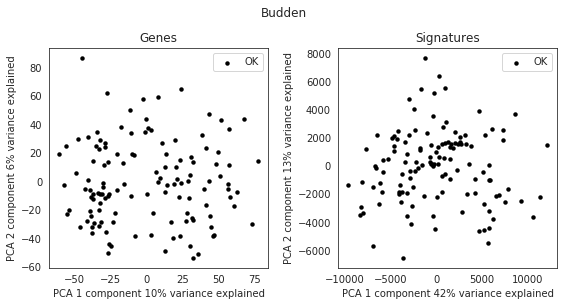

...

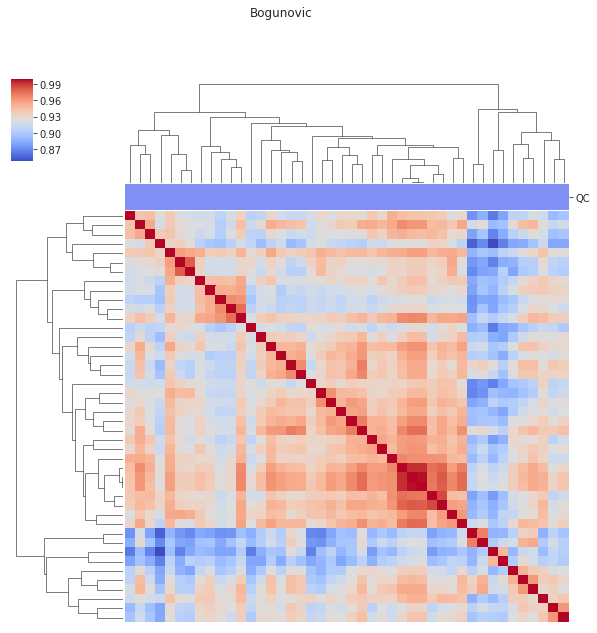

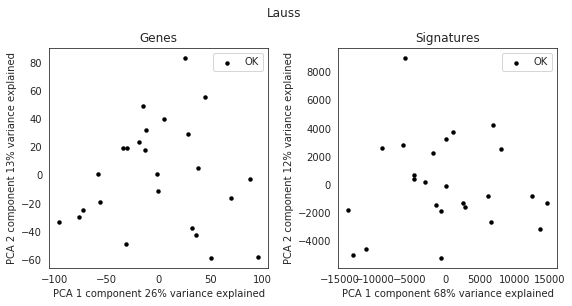

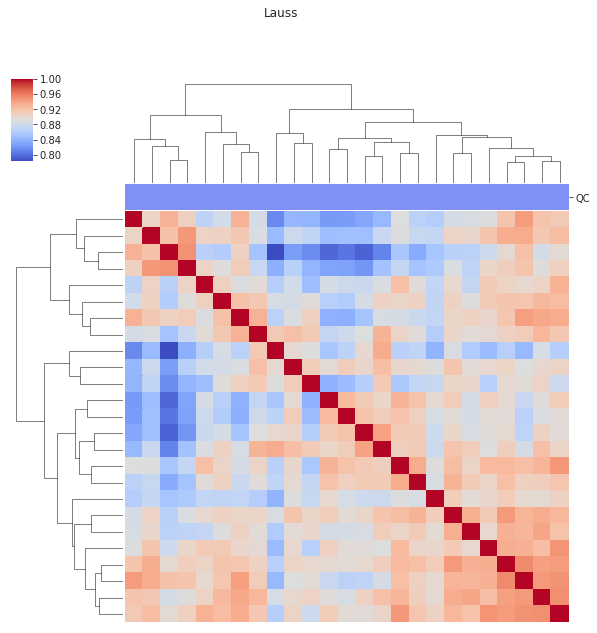

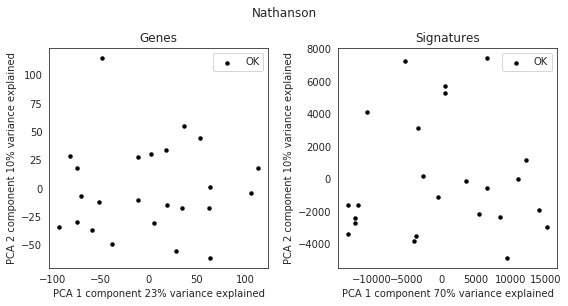

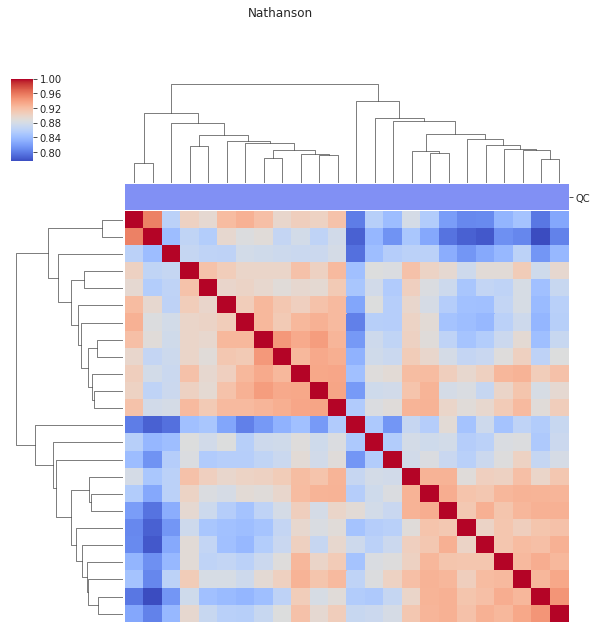

In [46]:
for cds in tqdm_notebook(OK_cohorts):
    cann, cgenes = to_common_samples([pan_ann[pan_ann.Cohort==cds], dm_genes_dst[cds]])
    
    csigns = ssgsea_formula(cgenes, immuno_gmt)
    af = axis_net(2, 1, title=cds, title_y = 1.05)
    pca_plot(cgenes, cann.QC.fillna('OK'), palette={'OK': black_color}, ax=next(af), title='Genes')
    pca_plot(csigns, cann.QC.fillna('OK'), palette={'OK': black_color}, ax=next(af), title='Signatures')
    plt.tight_layout()
    plt.show()
    
    clustering_heatmap(cgenes, col_colors=(~cann.QC.isna()).map(), 
                       xl=False, yl=False, 
                      title=cds)
    plt.show()

### Riaz et al. GSE91061 PMID: 29033130

Result: SRR5088893 sample excluded due to low correlation with the rest of samples

In [47]:
cds = 'Riaz'

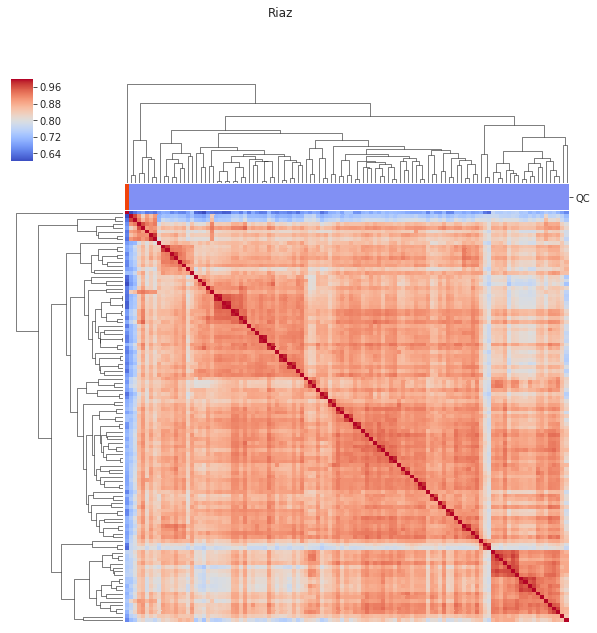

In [52]:
cann, cgenes = to_common_samples([pan_ann[pan_ann.Cohort==cds], dm_genes_dst[cds]])

g = clustering_heatmap(cgenes, col_colors=(~cann.QC.isna()).map(qc_ok_p), 
                   xl=False, yl=False, 
                  title=cds)
plt.show()

### Hao et al. GSE43081 PMID: 27663566

Result: GSM1056170, GSM1056172, GSM1056175 were excluded due to low correlation and being PCA outliers

In [57]:
cds = 'Hao'

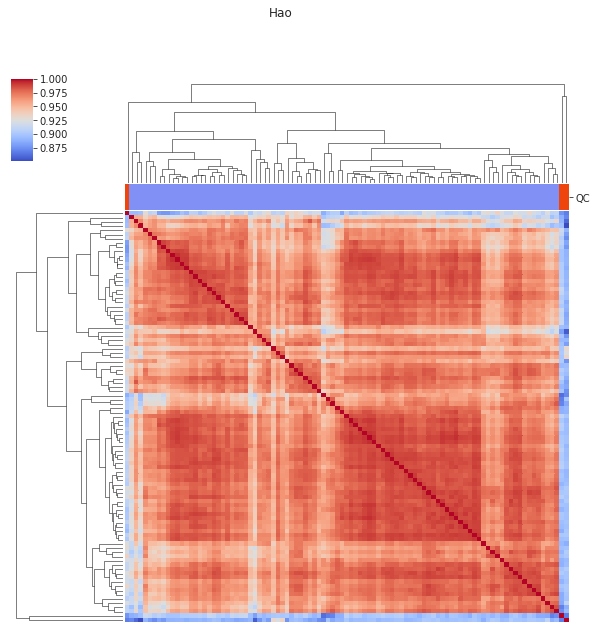

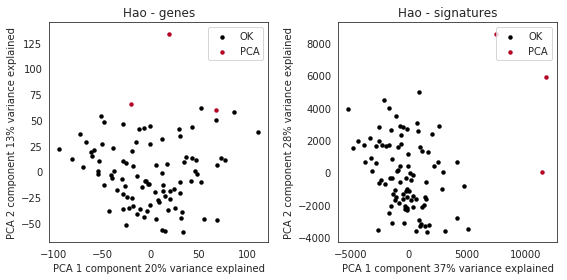

In [58]:
cann, cgenes = to_common_samples([pan_ann[pan_ann.Cohort==cds], dm_genes_dst[cds]])

g = clustering_heatmap(cgenes, col_colors=(~cann.QC.isna()).map(qc_ok_p), 
                   xl=False, yl=False, 
                  title=cds)
plt.show()


csigns = ssgsea_formula(cgenes, immuno_gmt)
af = axis_net(2, 1)
pca_plot(cgenes, cann.QC.fillna('OK'), palette={'OK': black_color, 
                                                'PCA': red_color}, ax=next(af), title=f'{cds} - genes')
pca_plot(csigns, cann.QC.fillna('OK'), palette={'OK': black_color, 
                                                'PCA': red_color}, ax=next(af), title=f'{cds} - signatures')
plt.tight_layout()
plt.show()

### Kunz et al. GSE112509 PMID: 29995873

Result: SRR6916944 was excluded due to low correlation and being a PCA outlier in all genes space with other samples

In [59]:
cds = 'Kunz'

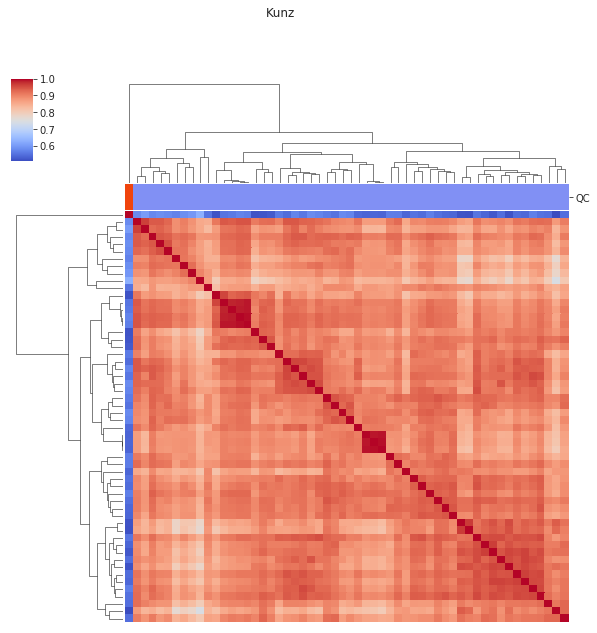

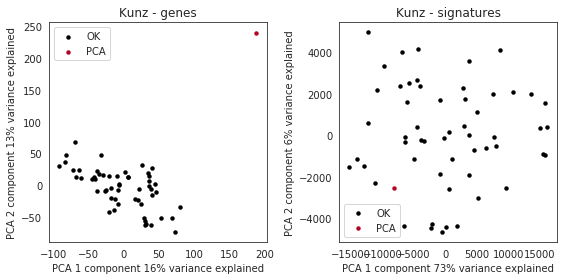

In [60]:
cann, cgenes = to_common_samples([pan_ann[pan_ann.Cohort==cds], dm_genes_dst[cds]])

g = clustering_heatmap(cgenes, col_colors=(~cann.QC.isna()).map(qc_ok_p), 
                   xl=False, yl=False, 
                  title=cds)
plt.show()


csigns = ssgsea_formula(cgenes, immuno_gmt)
af = axis_net(2, 1)
pca_plot(cgenes, cann.QC.fillna('OK'), palette={'OK': black_color, 
                                                'PCA': red_color}, ax=next(af), title=f'{cds} - genes')
pca_plot(csigns, cann.QC.fillna('OK'), palette={'OK': black_color, 
                                                'PCA': red_color}, ax=next(af), title=f'{cds} - signatures')
plt.tight_layout()
plt.show()

### Raskin et al. GSE15605 PMID: 23633021

Result: GSM390267 was excluded due to low correlation with the rest of samples and being a PCA outlier

In [61]:
cds = 'Raskin'

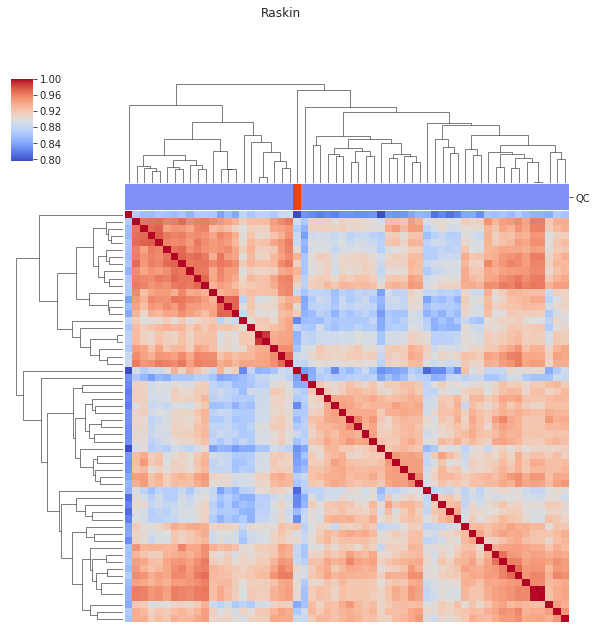

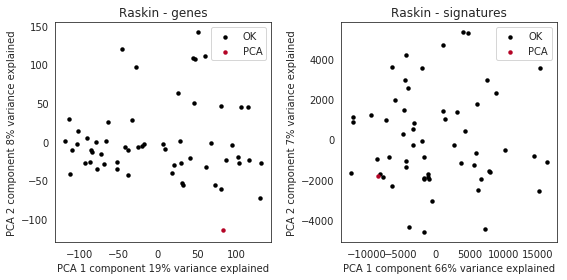

In [62]:
cann, cgenes = to_common_samples([pan_ann[pan_ann.Cohort==cds], dm_genes_dst[cds]])

g = clustering_heatmap(cgenes, col_colors=(~cann.QC.isna()).map(qc_ok_p), 
                   xl=False, yl=False, 
                  title=cds)
plt.show()


csigns = ssgsea_formula(cgenes, immuno_gmt)
af = axis_net(2, 1)
pca_plot(cgenes, cann.QC.fillna('OK'), palette={'OK': black_color, 
                                                'PCA': red_color}, ax=next(af), title=f'{cds} - genes')
pca_plot(csigns, cann.QC.fillna('OK'), palette={'OK': black_color, 
                                                'PCA': red_color}, ax=next(af), title=f'{cds} - signatures')
plt.tight_layout()
plt.show()

### Khan et al.  GSE131521, SRP198996 DOI: 10.1093/neuonc/noz175.346

SRR9097552 was excluded due to bad phred scores; <br> SRR9097556, SRR9097554 were excluded due to low correlation with the other samples and being PCA outlier

In [63]:
cds = 'Khan'

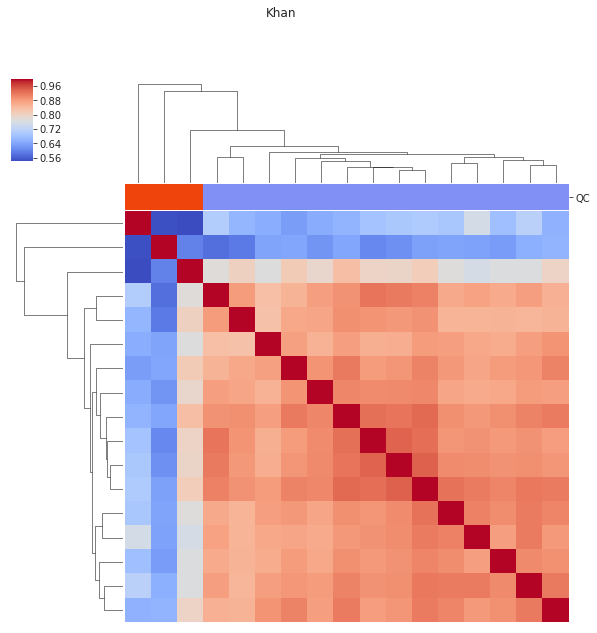

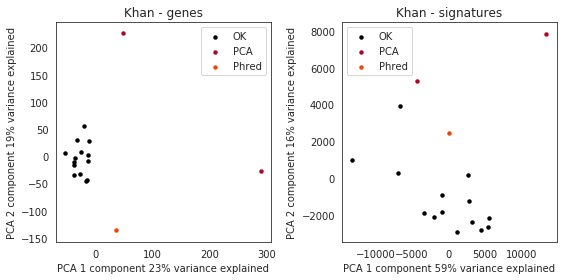

In [64]:
cann, cgenes = to_common_samples([pan_ann[pan_ann.Cohort==cds], dm_genes_dst[cds]])

g = clustering_heatmap(cgenes, col_colors=(~cann.QC.isna()).map(qc_ok_p), 
                   xl=False, yl=False, 
                  title=cds)
plt.show()


csigns = ssgsea_formula(cgenes, immuno_gmt)
af = axis_net(2, 1)
pca_plot(cgenes, cann.QC.fillna('OK'), palette={'OK': black_color, 
                                                'PCA': red_color, 
                                                'Phred': orange_color}, ax=next(af), title=f'{cds} - genes')
pca_plot(csigns, cann.QC.fillna('OK'), palette={'OK': black_color, 
                                                'PCA': red_color, 
                                                'Phred': orange_color}, ax=next(af), title=f'{cds} - signatures')
plt.tight_layout()
plt.show()

SRR9097552 excluded due to bad phred scores <br>
SRR9097556, SRR9097554 excluded due to low correlation with the rest samples and PCA outlier

### AJCC_1 + AJCC_2  GSE54467, GSE80435 PMIDs: 24975271, 28467829

AJCC_1 and AJCC_2 were recombined from cohorts GSE54467 and GSE80435 by platform <br>
AJCC_1 - GPL6884; AJCC_2 - GPL10558_2 <br>
In AJCC_1, GSE80435 samples were technically very similar to GSE54467 in the gene space. No batch effects were observed in the signature space; therefore, all samples were included in analysis.


In [65]:
cds = 'AJCC_1 + AJCC_2'

cann, cgenes = to_common_samples([pan_ann[pan_ann.Cohort.isin(['AJCC_1', 'AJCC_2'])], 
                                  pd.concat([dm_genes_dst['AJCC_1'], dm_genes_dst['AJCC_2']])])

In [66]:
cgenes.apply(lambda x: x.isna().any(None)).value_counts()

False    18565
True      2700
dtype: int64

2700 genes are missing on the GPL6884 platform

In [67]:
cgenes

,A1BG,A1BG-AS1,A1CF,A2M,A2ML1,A3GALT2,A4GALT,A4GNT,AA06,AAAS,...,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ZZZ3
GSM1315957,6.061352,NaN,6.019943,10.116460,6.011721,6.031955,6.263229,6.065789,6.037299,6.281354,...,6.240300,6.808442,6.228705,6.151465,6.400558,6.023828,9.107912,8.935218,7.216102,7.865407
GSM1315967,6.059723,NaN,6.034057,7.867722,6.017630,6.021967,6.700905,6.078553,6.040634,6.584144,...,6.132738,7.696908,6.302319,6.132628,6.725289,6.039676,7.893967,10.347156,7.020822,7.099810
GSM2127284,6.858956,NaN,6.720729,15.780134,6.373470,6.511989,6.838568,6.933454,6.363231,8.836425,...,9.725987,9.822145,8.277329,8.053949,10.411579,6.273171,13.252330,13.041881,11.402949,12.967847
GSM2127271,4.763892,4.413337,4.841991,10.431760,4.489911,4.614441,6.152518,5.123796,NaN,7.208153,...,7.096180,8.228062,5.117368,4.805906,5.685851,4.405343,9.455634,10.543949,7.993427,9.275963
GSM1315974,6.060616,NaN,6.077366,10.437265,6.025663,6.062946,6.147262,6.023443,6.026189,6.217463,...,6.210190,6.947746,6.208752,6.088292,7.208163,6.028410,9.727167,8.981228,7.074040,7.864479
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GSM1315938,6.066159,NaN,6.038339,8.560423,6.024872,6.027876,6.196079,6.028181,6.021007,6.439816,...,6.073526,6.164199,6.522176,6.168770,6.740930,6.016198,8.723733,8.029922,7.331901,7.432366
GSM1315961,6.055338,NaN,6.032425,11.426421,6.013809,6.029205,6.454880,6.101042,6.042057,6.559424,...,6.026770,6.505879,6.050346,6.049712,6.857607,6.024747,7.264191,10.252711,7.212403,6.604528
GSM1315906,6.072082,NaN,6.033616,9.428237,6.013300,6.040051,6.056317,6.052132,6.027100,6.233753,...,6.165753,7.068118,6.294185,6.208477,6.792949,6.032562,9.656384,7.417420,6.969265,7.213906
GSM1315918,6.072771,NaN,6.027517,10.055956,6.019095,6.028510,6.331869,6.040947,6.040770,6.097918,...,6.190501,6.894839,6.295041,6.220099,6.659311,6.016198,8.939365,8.296066,6.809598,7.915194


In [68]:
cgenes = cgenes.dropna(axis=1)
cgenes.shape

(112, 18565)

Signatures will be calculated by platform

In [72]:
csigns = pd.concat([ssgsea_formula(dm_genes_dst[i], immuno_gmt) for i in ['AJCC_1', 'AJCC_2']])
csigns.shape

(112, 29)

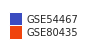

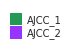

In [73]:
gse_p = {'GSE54467': blue_color, 
         'GSE80435': orange_color}
patch_plot(gse_p)
coh_p = {'AJCC_1': green_color, 
         'AJCC_2': purple_color}
patch_plot(coh_p)

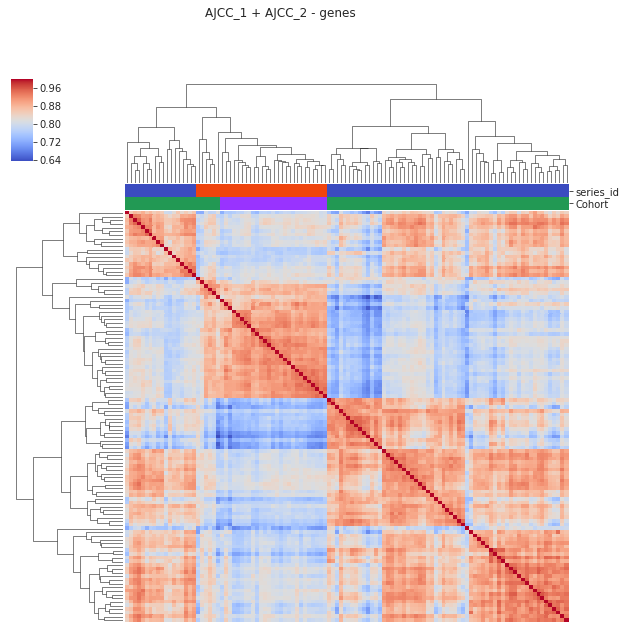

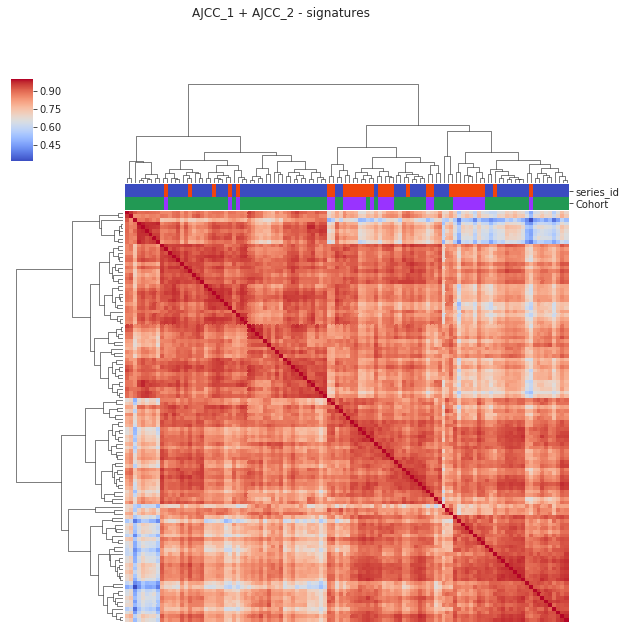

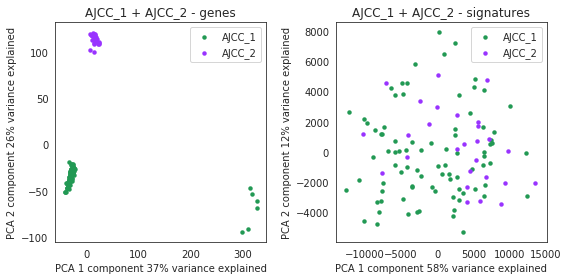

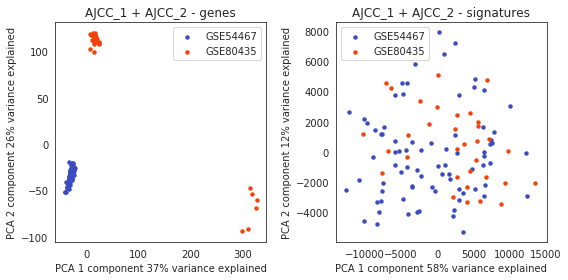

In [74]:
g = clustering_heatmap(cgenes, col_colors=pd.concat([cann.series_id.map(gse_p),
                                                     cann.Cohort.map(coh_p)], axis=1), 
                   xl=False, yl=False, title=f'{cds} - genes')
plt.show()

g = clustering_heatmap(csigns, col_colors=pd.concat([cann.series_id.map(gse_p),
                                                     cann.Cohort.map(coh_p)], axis=1), 
                   xl=False, yl=False, title=f'{cds} - signatures')
plt.show()

af = axis_net(2, 1)
pca_plot(cgenes, cann.Cohort, palette=coh_p, ax=next(af), title=f'{cds} - genes')
pca_plot(csigns, cann.Cohort, palette=coh_p, ax=next(af), title=f'{cds} - signatures')
plt.tight_layout()
plt.show()

af = axis_net(2, 1)
pca_plot(cgenes, cann.series_id, palette=gse_p, ax=next(af), title=f'{cds} - genes')
pca_plot(csigns, cann.series_id, palette=gse_p, ax=next(af), title=f'{cds} - signatures')
plt.tight_layout()
plt.show()

First, we divided the cohorts by platform. Although they did not show batch effects on the PCA plot in the signature space, they were processed as separate batches.
We additionally checked the 6 samples on the different platform from GSE80435 that were assigned to AJCC_1, and they had good correlation with all other samples on the same platform, supporting that the observed batch effects in gene expression were technical but not worth processing in a separate batch. Moreover, the batch effect was successfully corrected in the signature space, enabling processing with the other AJCC_1 samples.

In [75]:
cds = 'AJCC_1'

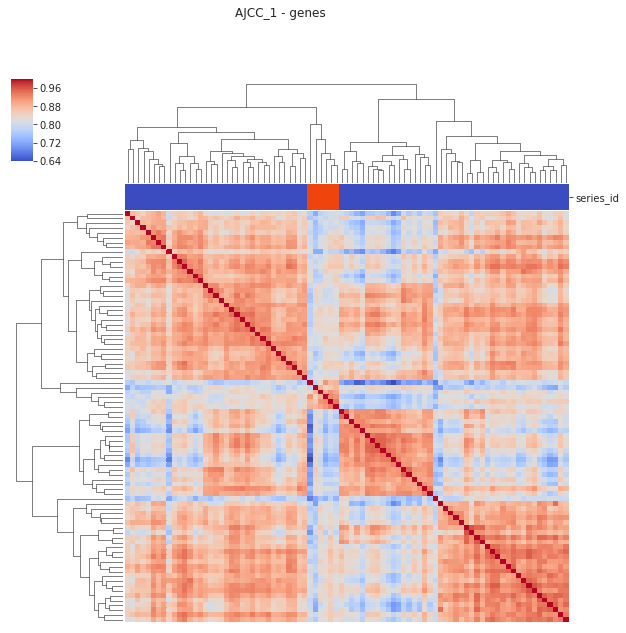

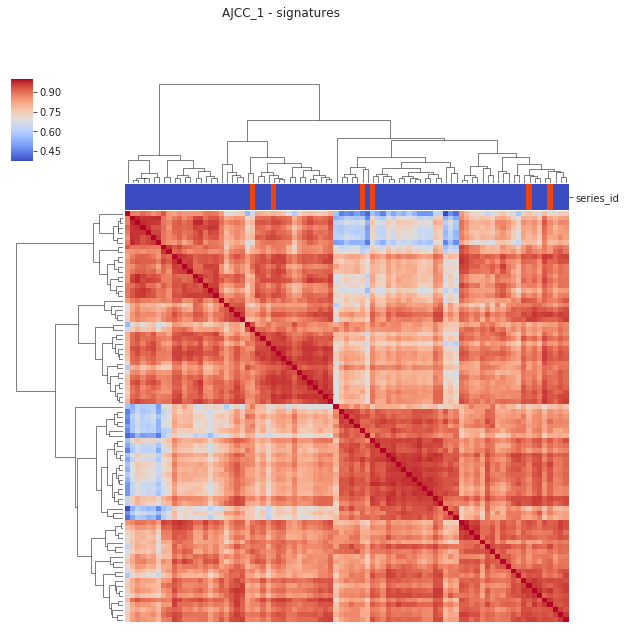

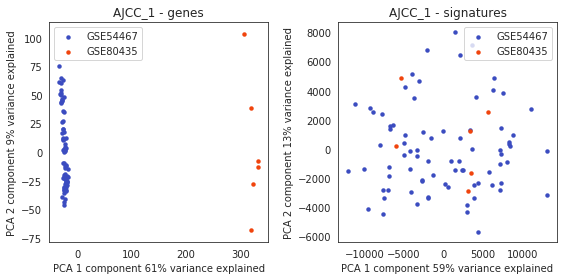

In [76]:
cann, cgenes = to_common_samples([pan_ann[pan_ann.Cohort==cds], dm_genes_dst[cds]])
csigns = ssgsea_formula(cgenes, immuno_gmt)

g = clustering_heatmap(cgenes, col_colors=cann.series_id.map(gse_p), 
                   xl=False, yl=False, title=f'{cds} - genes')
plt.show()

g = clustering_heatmap(csigns, col_colors=cann.series_id.map(gse_p), 
                   xl=False, yl=False, title=f'{cds} - signatures')
plt.show()

af = axis_net(2, 1)
pca_plot(cgenes, cann.series_id, palette=gse_p, ax=next(af), title=f'{cds} - genes')
pca_plot(csigns, cann.series_id, palette=gse_p, ax=next(af), title=f'{cds} - signatures')
plt.tight_layout()
plt.show()

In [77]:
cds = 'AJCC_2'

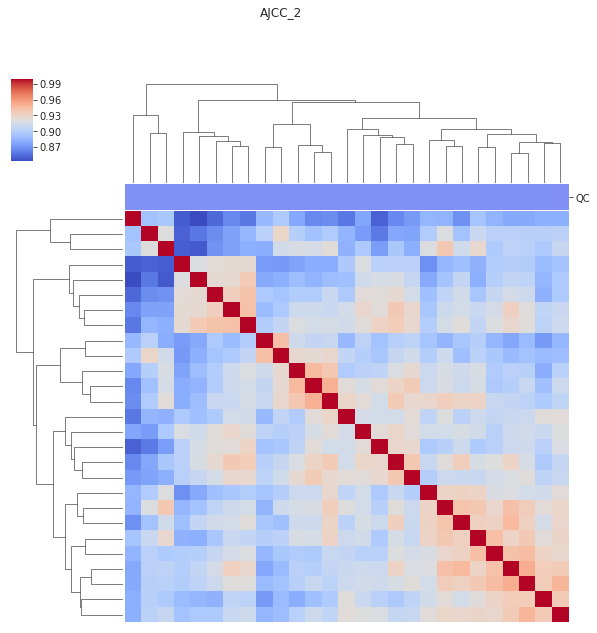

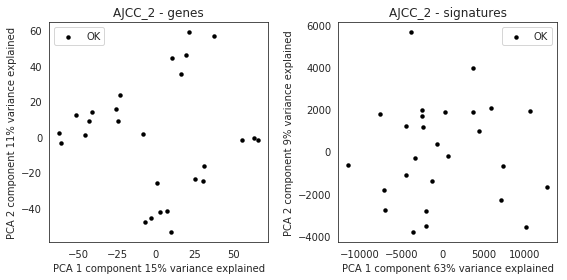

In [78]:
cann, cgenes = to_common_samples([pan_ann[pan_ann.Cohort==cds], dm_genes_dst[cds]])

g = clustering_heatmap(cgenes, col_colors=(~cann.QC.isna()).map(qc_ok_p), 
                   xl=False, yl=False, 
                  title=cds)
plt.show()


csigns = ssgsea_formula(cgenes, immuno_gmt)
af = axis_net(2, 1)
pca_plot(cgenes, cann.QC.fillna('OK'), palette={'OK': black_color, 
                                                'PCA': red_color, 
                                                'Phred': orange_color}, ax=next(af), title=f'{cds} - genes')
pca_plot(csigns, cann.QC.fillna('OK'), palette={'OK': black_color, 
                                                'PCA': red_color, 
                                                'Phred': orange_color}, ax=next(af), title=f'{cds} - signatures')
plt.tight_layout()
plt.show()

### Jonsson et al. GSE22153 PMID: 20460471

Overall correlation in the space of all genes was relatively low; however, this is expected for data generated with Illumina arrays. Moreover, all the samples uniformly correlated with each other; therefore, we included all samples in the analysis; including GSM550977, an outlier in signature space, that also had good correlation with a number of samples.

In [79]:
cds = 'Jonsson'

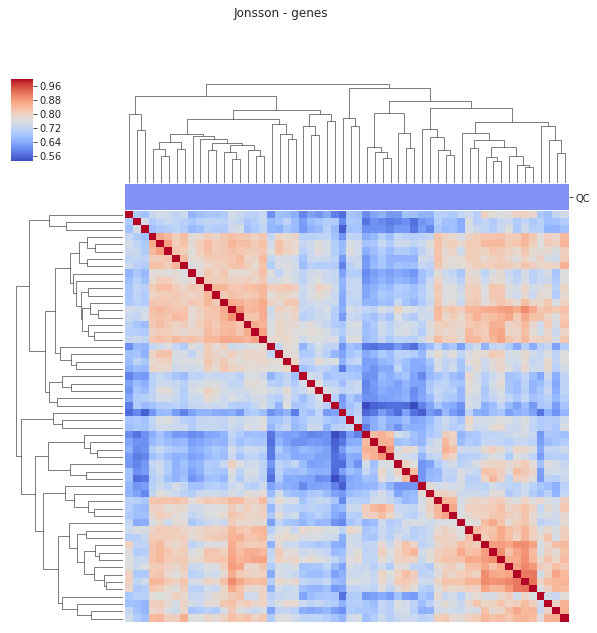

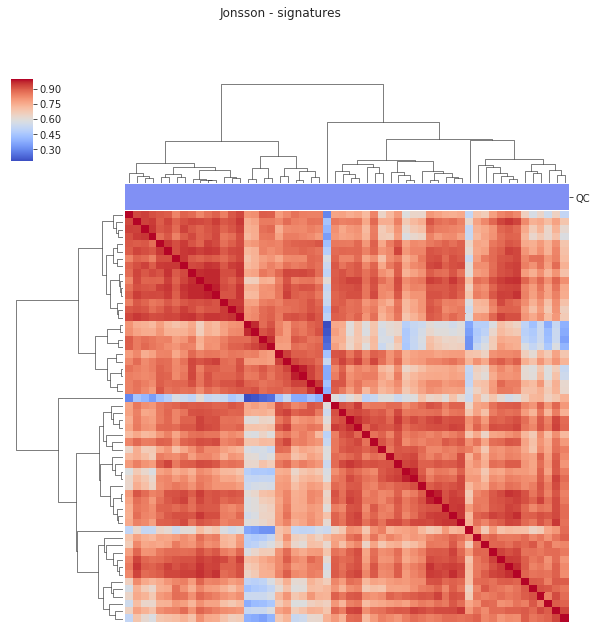

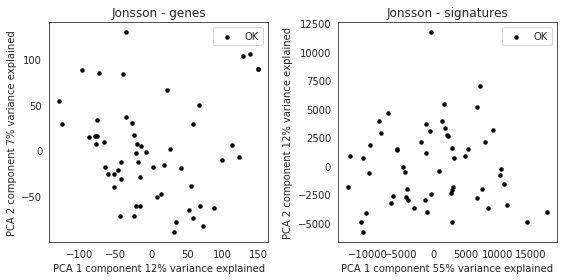

In [80]:
cann, cgenes = to_common_samples([pan_ann[pan_ann.Cohort==cds], dm_genes_dst[cds]])
csigns = ssgsea_formula(cgenes, immuno_gmt)

g = clustering_heatmap(cgenes, col_colors=(~cann.QC.isna()).map(qc_ok_p), 
                   xl=False, yl=False, title=f'{cds} - genes')
plt.show()
g = clustering_heatmap(csigns, col_colors=(~cann.QC.isna()).map(qc_ok_p), 
                   xl=False, yl=False, title=f'{cds} - signatures')
plt.show()


af = axis_net(2, 1)
pca_plot(cgenes, cann.QC.fillna('OK'), palette={'OK': black_color, 
                                                'PCA': red_color, 
                                                'Phred': orange_color}, ax=next(af), title=f'{cds} - genes')
pca_plot(csigns, cann.QC.fillna('OK'), palette={'OK': black_color, 
                                                'PCA': red_color, 
                                                'Phred': orange_color}, ax=next(af), title=f'{cds} - signatures')
plt.tight_layout()
plt.show()

###  Xu et al.  GSE8401 PMID: 18505921

In [81]:
cds = 'Xu'

In [82]:
cann, cgenes = to_common_samples([pan_ann[pan_ann.Cohort==cds], dm_genes_dst[cds]])
csigns = ssgsea_formula(cgenes, immuno_gmt)

In [83]:
cann.Site.value_counts()

Metastasis    52
Primary       31
Name: Site, dtype: int64

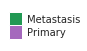

In [84]:
site_p = {'Metastasis': green_color, 
          'Primary': '#A569BD'}
patch_plot(site_p)

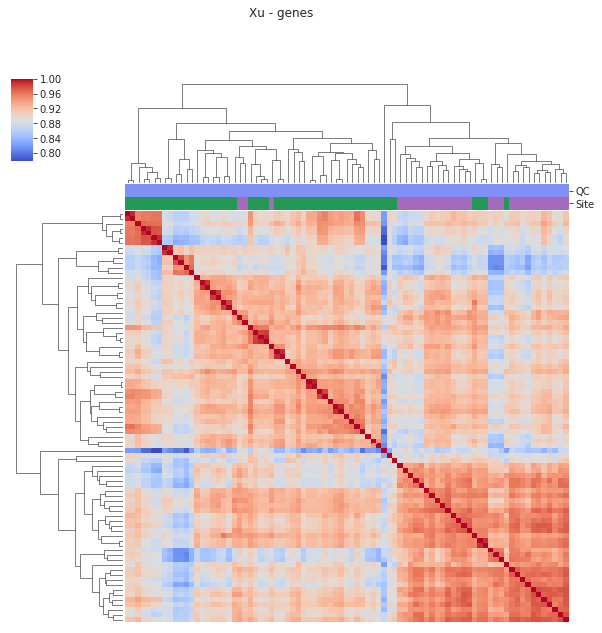

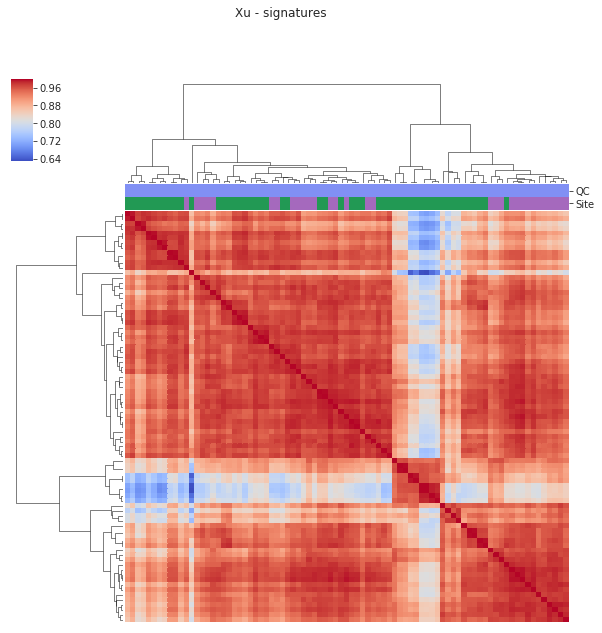

In [85]:
g = clustering_heatmap(cgenes, col_colors=pd.concat([(~cann.QC.isna()).map(qc_ok_p), 
                                                     cann.Site.map(site_p)], axis=1), 
                   xl=False, yl=False, title=f'{cds} - genes')
plt.show()
g = clustering_heatmap(csigns, col_colors=pd.concat([(~cann.QC.isna()).map(qc_ok_p), 
                                                     cann.Site.map(site_p)], axis=1), 
                   xl=False, yl=False, title=f'{cds} - signatures')
plt.show()

Gene correlation for all samples was >80%. Biological-based batch effects (primary vs metastatic) were observed’ however, we deemed these OK to be included as we did not observe low correlations among the samples. We additionally investigated a group of samples (N=9) in the signature scores space.

PCA Colored by Site

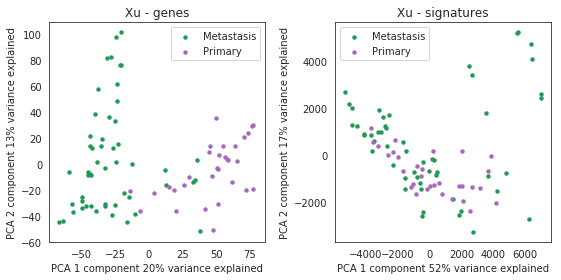

In [86]:
af = axis_net(2, 1)
pca_plot(cgenes, cann.Site, palette=site_p, ax=next(af), title=f'{cds} - genes')
pca_plot(csigns, cann.Site, palette=site_p, ax=next(af), title=f'{cds} - signatures')
plt.tight_layout()
plt.show()

There is an outlier group of metastatic siamples (N=9) in the signature space

In [89]:
# get the group of samples from the signatures clustering above
cut = cut_clustermap_tree(g, n_clusters=3).map({3: 'Group', 1: 'Others', 2: 'Others'})
cut.value_counts()

Others    74
Group      9
Name: Clusters, dtype: int64

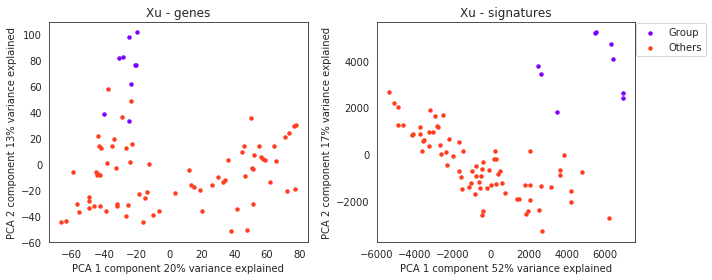

In [90]:
af = axis_net(2, 1, x_len=5)
pca_plot(cgenes, cut, ax=next(af), title=f'{cds} - genes', legend=False)
pca_plot(csigns, cut, ax=next(af), title=f'{cds} - signatures', legend='out')
plt.tight_layout()
plt.show()

PCA Colored by Location

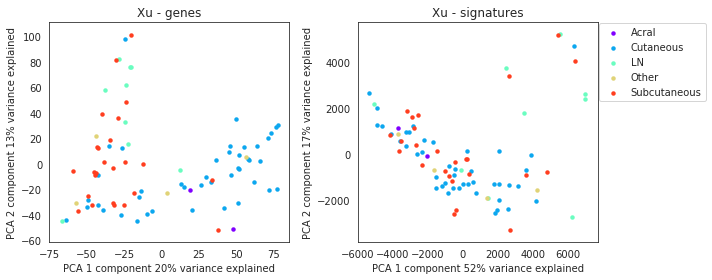

In [91]:
af = axis_net(2, 1, x_len=5)
pca_plot(cgenes, pan_ann.Location[cgenes.index], ax=next(af), title=f'{cds} - genes', legend=False)
pca_plot(csigns, pan_ann.Location[csigns.index], ax=next(af), title=f'{cds} - signatures', legend='out')
plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Locations in the Group')

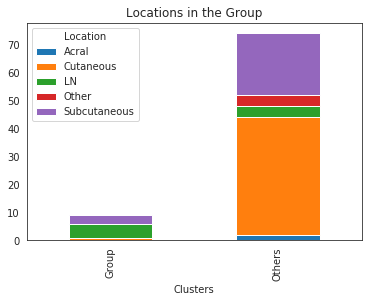

In [98]:
ax = pivot_vectors(cut, pan_ann.Location).T.plot(kind='bar', stacked=True)
ax.set_title('Locations in the Group')

In [101]:
from scipy.stats import mannwhitneyu
pval = mannwhitneyu(pan_ann.Inflammatory_cells[pan_ann.index & cut[cut=='Group'].index].dropna(), 
             pan_ann.Inflammatory_cells[pan_ann.index & cut[cut=='Others'].index].dropna(), 
             alternative='two-sided')[1]

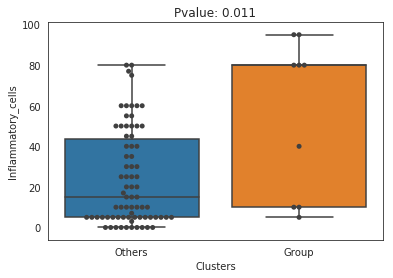

In [109]:
ax = sns.boxplot(y=pan_ann.Inflammatory_cells, x=cut)
sns.swarmplot(y=pan_ann.Inflammatory_cells, x=cut, ax=ax, color='.25')
ax.set_title(f'Pvalue: {pval:.2}')
plt.show()


The outlier group is enriched with LN metastasis biopsies and with inflammatory cells; therefore, it was not a technical batch effect, allowing us to include all samples in the analysis.

### Auslander et al. GSE115821 PMID: 30127394

In [110]:
cds = 'Auslander'

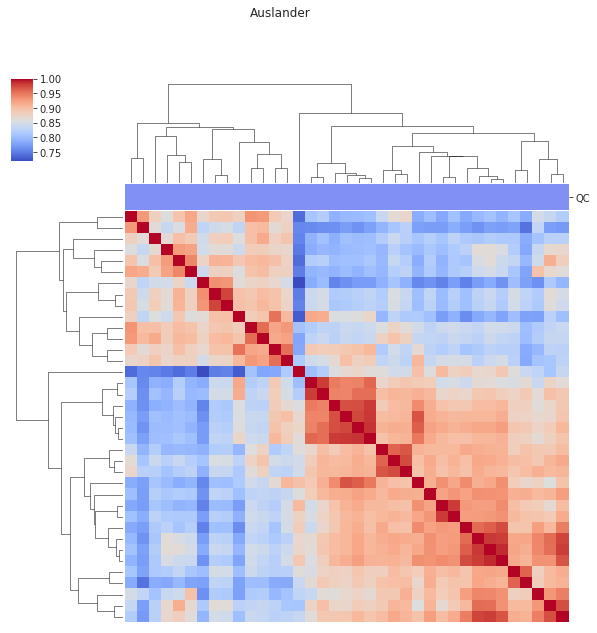

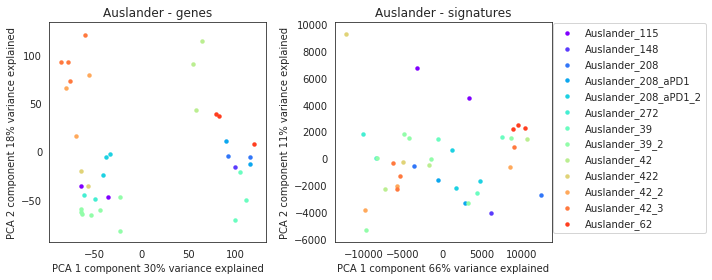

In [111]:
cann, cgenes = to_common_samples([pan_ann[pan_ann.Cohort==cds], dm_genes_dst[cds]])

g = clustering_heatmap(cgenes, col_colors=(~cann.QC.isna()).map(qc_ok_p), 
                   xl=False, yl=False, 
                  title=cds)
plt.show()


csigns = ssgsea_formula(cgenes, immuno_gmt)
af = axis_net(2, 1, x_len=5)
pca_plot(cgenes, cann.Patient, ax=next(af), title=f'{cds} - genes', legend=False)
pca_plot(csigns, cann.Patient, ax=next(af), title=f'{cds} - signatures', legend='out')
plt.tight_layout()
plt.show()

All samples consisted of 2 groups, and all patients have multiple samples, including multi-regional, technical replicates, longitudinal, creating a difficult cohort for analysis; however, we still included this cohort in our analysis and did not alter the cohort.

### Liang et al. phs001036 PMID: 28373299

The cohort consists of samples sequenced from FFPE using Total RNAseq or from FF using Poly-A. We split the cohort by the sequencing protocol.

In [112]:
cds = 'Liang'

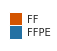

In [113]:
sm_p = {'FFPE': '#2471A3', 
        'FF': '#D35400'}
patch_plot(sm_p)

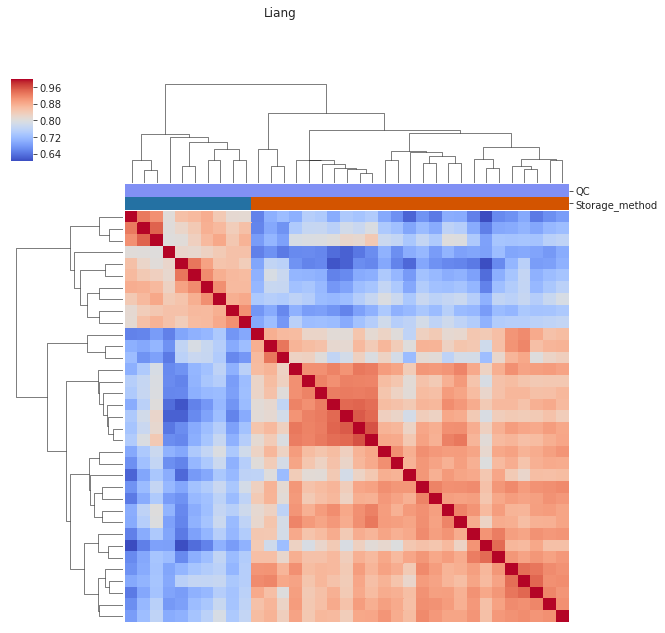

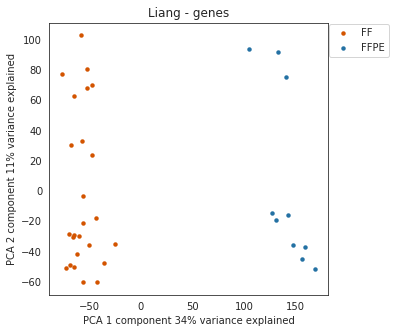

In [114]:
cann, cgenes = to_common_samples([pan_ann[pan_ann.Cohort==cds], dm_genes_dst[cds]])

g = clustering_heatmap(cgenes, col_colors=pd.concat([(~cann.QC.isna()).map(qc_ok_p),
                                                     cann.Storage_method.map(sm_p)], axis=1), 
                   xl=False, yl=False, 
                  title=cds)
plt.show()


                                                     
pca_plot(cgenes, cann.Storage_method, palette=sm_p, title=f'{cds} - genes', legend='out')
plt.show()

The cohort consists of samples sequenced from FFPE using Total RNAseq or from FF using Poly-A. We split the cohort by the protocol. 

### Hugo et al. and Garcia-Diaz et al. GSE78220, GSE96619 PMIDs: 26997480, 28494860

Samples from Hugo + Garcia-Diaz (samples were generated in 1 lab) were analyzed together.

In [115]:
cds = 'Hugo'

In [125]:
cann, cgenes = to_common_samples([pan_ann[pan_ann.Cohort==cds], pd.concat([dm_genes_dst[cds], cgenes.loc[['Pt28']]])])

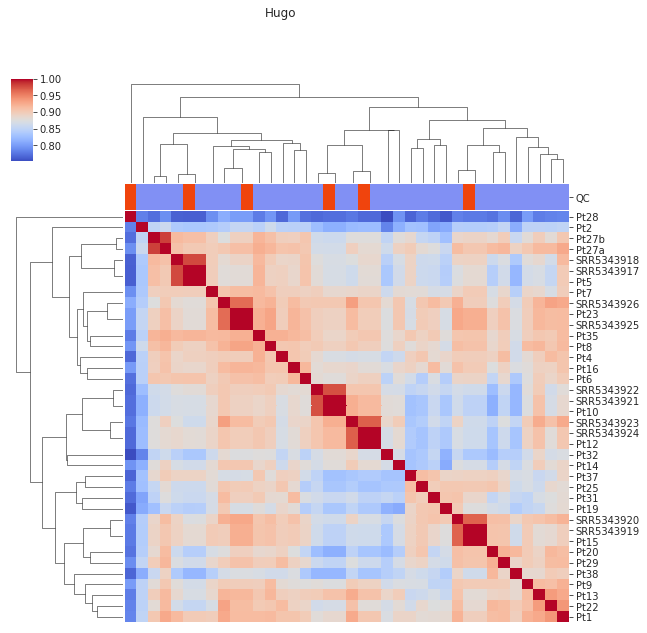

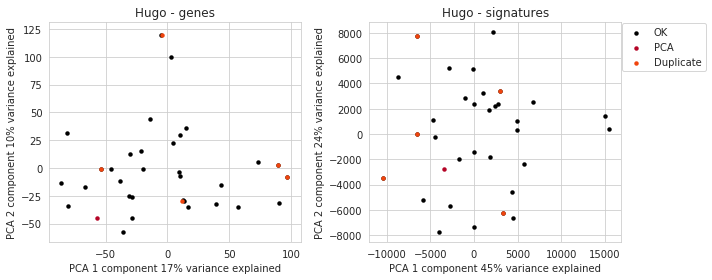

In [126]:
cann, cgenes = to_common_samples([pan_ann[pan_ann.Cohort==cds], dm_genes_dst[cds]])

g = clustering_heatmap(cgenes, col_colors=(~cann.QC.isna()).map(qc_ok_p), 
                   xl=False, yl=True, title=cds)
plt.show()


csigns = ssgsea_formula(cgenes, immuno_gmt)
af = axis_net(2, 1, x_len=5)
pca_plot(cgenes, cann.QC.fillna('OK'), palette={'OK': black_color,  'PCA': red_color, 'Duplicate': orange_color}, 
         order=['OK',  'PCA', 'Duplicate'], ax=next(af), title=f'{cds} - genes', legend=False)
pca_plot(csigns, cann.QC.fillna('OK'), palette={'OK': black_color, 'PCA': red_color, 'Duplicate': orange_color}, 
         order=['OK',  'PCA', 'Duplicate'], ax=next(af), title=f'{cds} - signatures', legend='out')
plt.tight_layout()
plt.show()

Pt28 was excluded due to low correlation with all other samples

As shown, 6 dots (samples) are colored in orange - hiding other black samples, showing almost 100% correlation between samples. These overlapping samples seemed to be re-sequenced or re-submitted samples. They also had similar HLA genotypes and are 100% concordant by the conpair algorithm (germline mutations).

Highly correlating samples (>0.96 pearson correlation) are visualized on the correlation graph below

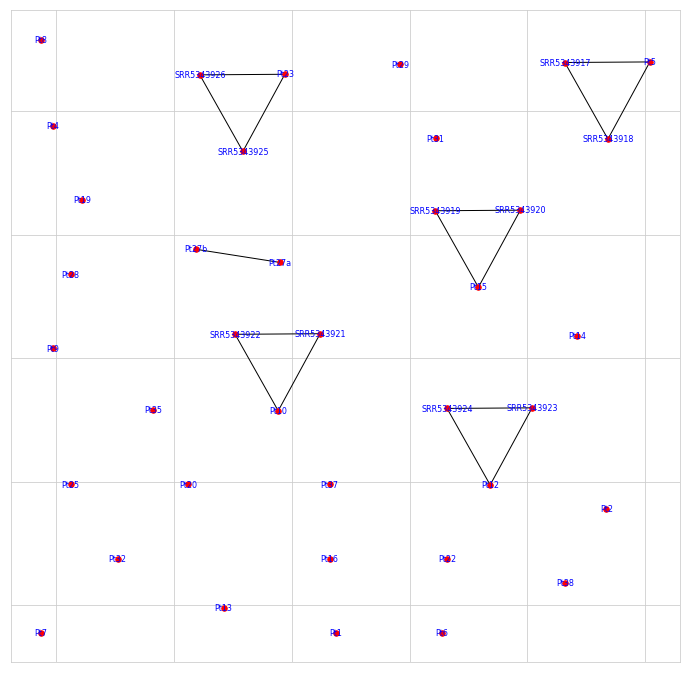

In [137]:
g = gen_graph2(cgenes.T.corr(), .96)
draw_graph(g, e_labels=False)

In [138]:
for cc in nx.connected_components(g):
    print(sorted(list(cc)))

['Pt37']
['Pt20']
['Pt35']
['Pt31']
['Pt10', 'SRR5343921', 'SRR5343922']
['Pt15', 'SRR5343919', 'SRR5343920']
['Pt12', 'SRR5343923', 'SRR5343924']
['Pt4']
['Pt16']
['Pt22']
['Pt23', 'SRR5343925', 'SRR5343926']
['Pt9']
['Pt1']
['Pt6']
['Pt2']
['Pt32']
['Pt27a', 'Pt27b']
['Pt5', 'SRR5343917', 'SRR5343918']
['Pt38']
['Pt14']
['Pt19']
['Pt8']
['Pt7']
['Pt29']
['Pt28']
['Pt25']
['Pt13']


Samples from Garcia-Diaz et al. that overlap with Hugo et al. cohort<br>
Pt23, SRR5343925, SRR5343926 <br>
Pt5, SRR5343917, SRR5343918 <br>
Pt12, SRR5343923, SRR5343924 <br>
Pt15, SRR5343919, SRR5343920 <br>
Pt10, SRR5343921, SRR5343922

Let's raise the similarity threshold (up to 0.99) to get the duplicate samples

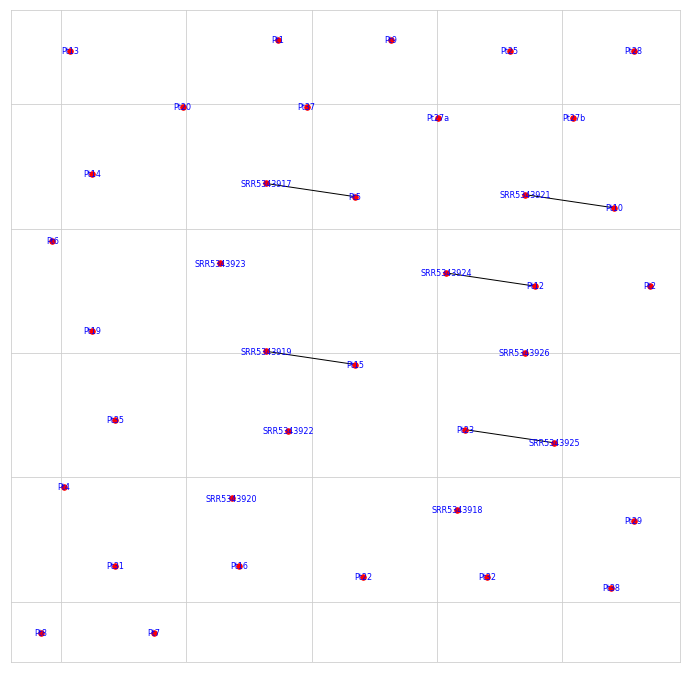

In [139]:
g = gen_graph2(cgenes.T.corr(), .99)
draw_graph(g, e_labels=False)

list all groups od samples

In [140]:
for cc in nx.connected_components(g):
    print(sorted(list(cc)))

['Pt37']
['Pt20']
['Pt35']
['Pt31']
['SRR5343922']
['Pt15', 'SRR5343919']
['Pt12', 'SRR5343924']
['Pt4']
['Pt16']
['Pt22']
['SRR5343926']
['Pt9']
['Pt1']
['Pt23', 'SRR5343925']
['Pt6']
['Pt2']
['Pt32']
['SRR5343920']
['Pt10', 'SRR5343921']
['Pt27b']
['Pt5', 'SRR5343917']
['Pt38']
['SRR5343918']
['Pt14']
['Pt19']
['SRR5343923']
['Pt8']
['Pt7']
['Pt29']
['Pt28']
['Pt25']
['Pt13']
['Pt27a']


Some samples are just copies (re-sequenced or re-deposited)<br>
Pt5 = SRR5343917<br>
Pt12= SRR5343924<br>
Pt23= SRR5343925<br>
Pt15= SRR5343919<br>
Pt10= SRR5343921<br>


potential label/time mix-up SRR5343923 - pre; SRR5343924 - post<br>
This did not affect any downstream conclusions as the patient’s TME subtype did not change (pre/post = F)

SRR5343917, SRR5343924, SRR5343925, SRR5343919, SRR5343921 samples excluded as duplicates

### VanAllen phs000452 PMID: 26359337

pat41 excluded due to low coverage <br>
pat02 excluded because it is PCA outlier

In [193]:
cds = 'VanAllen'

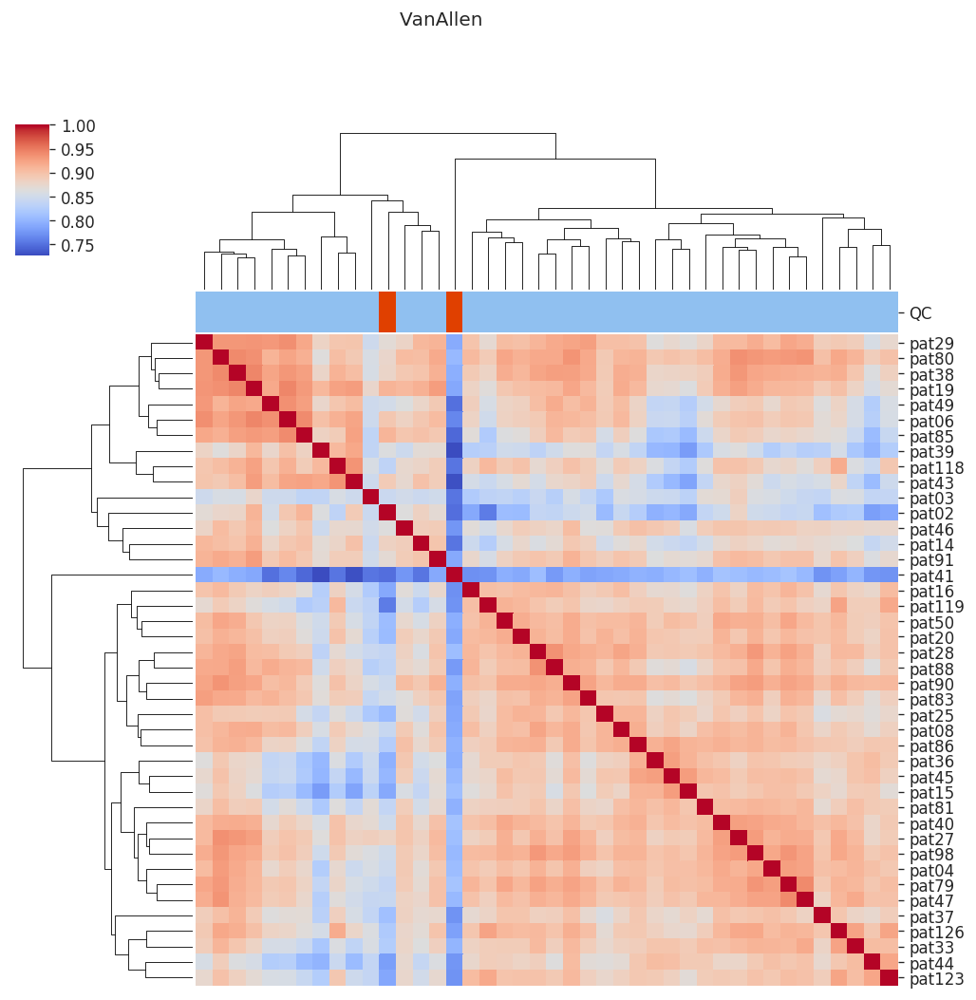

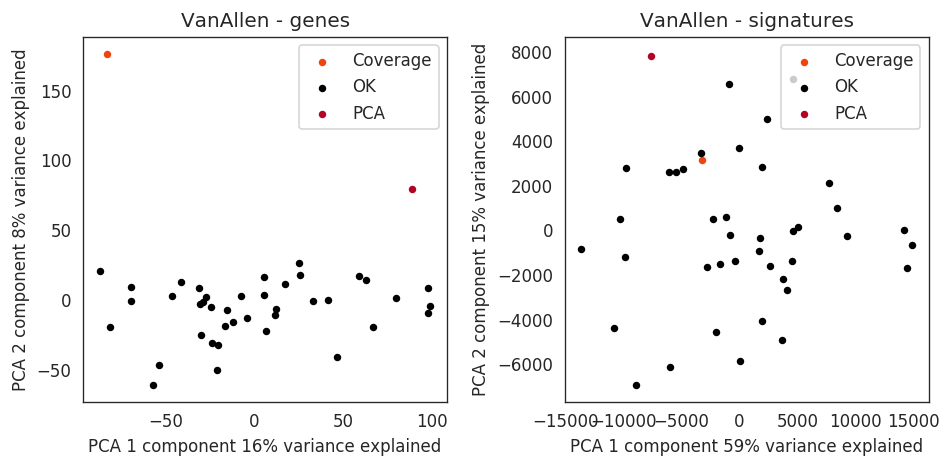

In [198]:
cann, cgenes = to_common_samples([pan_ann[pan_ann.Cohort==cds], dm_genes_dst[cds]])

g = clustering_heatmap(cgenes, col_colors=(~cann.QC.isna()).map(qc_ok_p), 
                   xl=False, yl=True, title=cds)
plt.show()


csigns = ssgsea_formula(cgenes, immuno_gmt)
af = axis_net(2, 1)
pca_plot(cgenes, cann.QC.fillna('OK'), palette={'OK': black_color, 
                                                'Coverage': orange_color,
                                                'PCA': red_color}, ax=next(af), title=f'{cds} - genes')
pca_plot(csigns, cann.QC.fillna('OK'), palette={'OK': black_color, 
                                                'Coverage': orange_color,
                                                'PCA': red_color}, ax=next(af), title=f'{cds} - signatures')
plt.tight_layout()
plt.show()

pat41 excluded due to low coverage<br>
pat02 excluded because it is PCA outlier

# Assign a Batch Group for each dataset based on sequencing platform (polyA RNA-seq, total RNA-seq array platform) and sample type (Fresh Frozen, FFPE)

In [141]:
pan_ann_f = pan_ann[pan_ann.QC.isna()]
pan_ann.shape, pan_ann_f.shape

((2066, 146), (2043, 146))

In [142]:
pan_ann_f.platform_id.value_counts()

RNAseqBG    1000
GPL570       312
GPL10558     241
RNAseq       140
GPL8432      126
GPL6884       85
GPL96         83
GPL6102       56
Name: platform_id, dtype: int64

RNAseqBG - recalculated from raw fastq files using XENA pipeline. Will be checked for batches and re-assignted into cohort groups<br>
RNAseq - Liu et al. cohort downloaded from the supplements, transformed to TPM. Will form separate batch<br>
Others - microarrays. They will form separate batches per dataset (and platform  in case of AJCC)

Please note an example of this process for GPL570 below

## GPL570 array batch

In [153]:
cplatform = 'GPL570'

Here cohort = batch (cohort_group)

In [154]:
cann = pan_ann_f[pan_ann_f.platform_id==cplatform]
cgenes = pd.concat([dm_genes_dst[cds] for cds in cann.Cohort.unique()])

cann, cgenes = to_common_samples([cann, cgenes])

csigns = ssgsea_formula(cgenes, immuno_gmt)

# signatures scalled by cohort
csigns_sc = pd.concat([median_scale(csigns.loc[samps.index], 4) for cb, samps in cann.groupby('Cohort_group')])

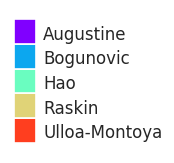

In [155]:
coh_p = {'Augustine': '#8000ff',
 'Bogunovic': '#0ca7ef',
 'Hao': '#6afdc0',
 'Raskin': '#e0d377',
 'Ulloa-Montoya': '#ff3e1f'}
patch_plot(coh_p)

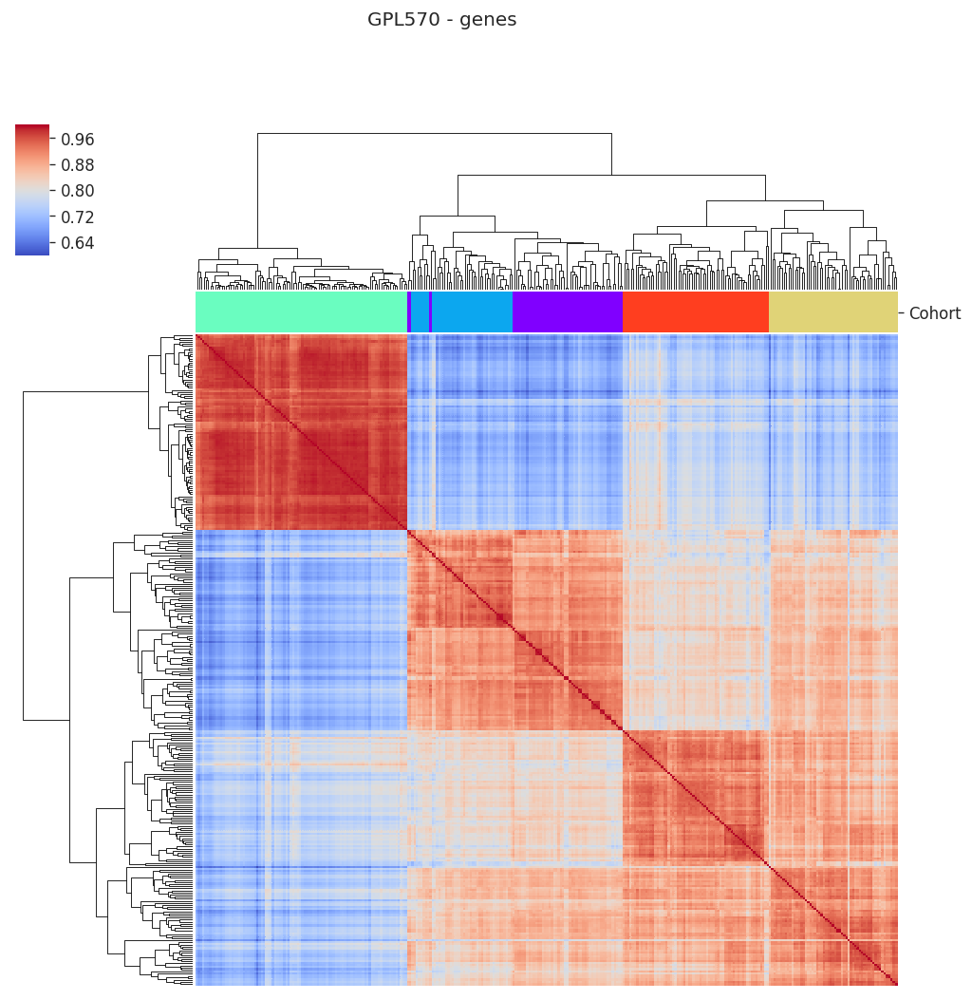

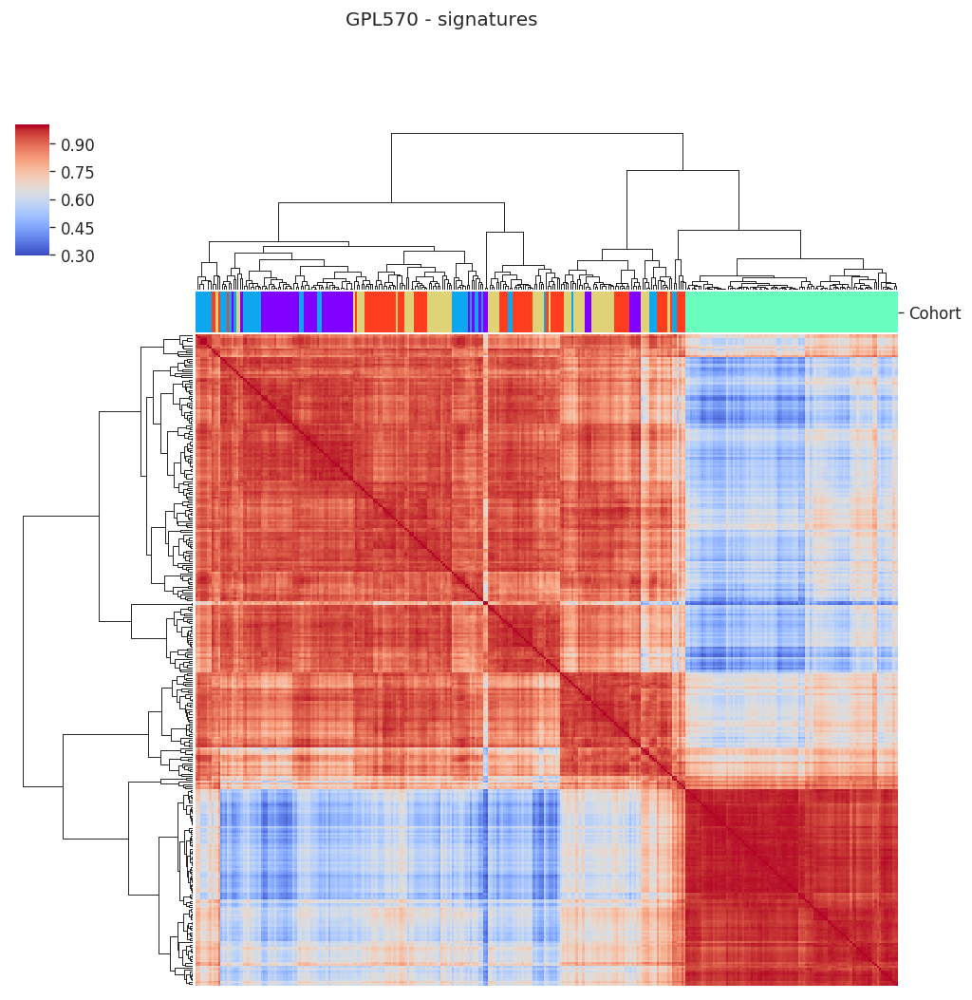

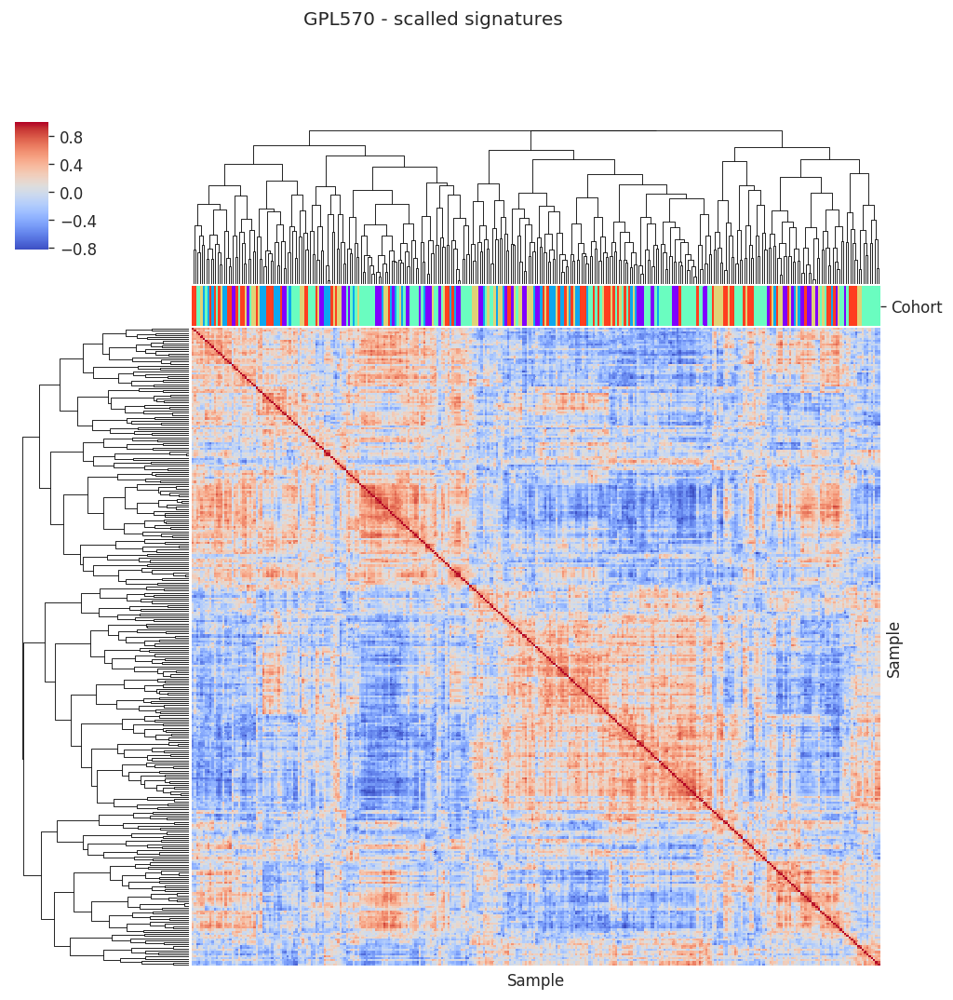

In [156]:
g = clustering_heatmap(cgenes, col_colors=cann.Cohort.map(coh_p), 
                   xl=False, yl=False, title=f'{cplatform} - genes')
plt.show()
g = clustering_heatmap(csigns, col_colors=cann.Cohort.map(coh_p), 
                   xl=False, yl=False, title=f'{cplatform} - signatures')
plt.show()
g = clustering_heatmap(csigns_sc, col_colors=cann.Cohort.map(coh_p), 
                   xl=False, yl=False, title=f'{cplatform} - scalled signatures')
plt.show()

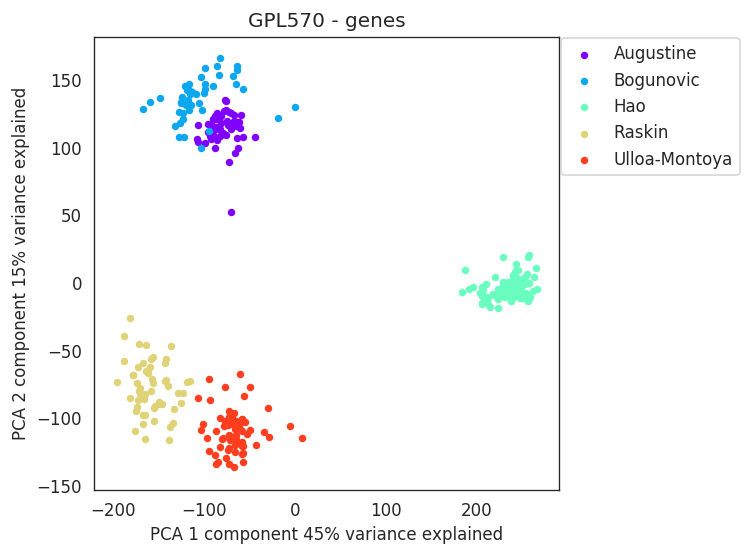

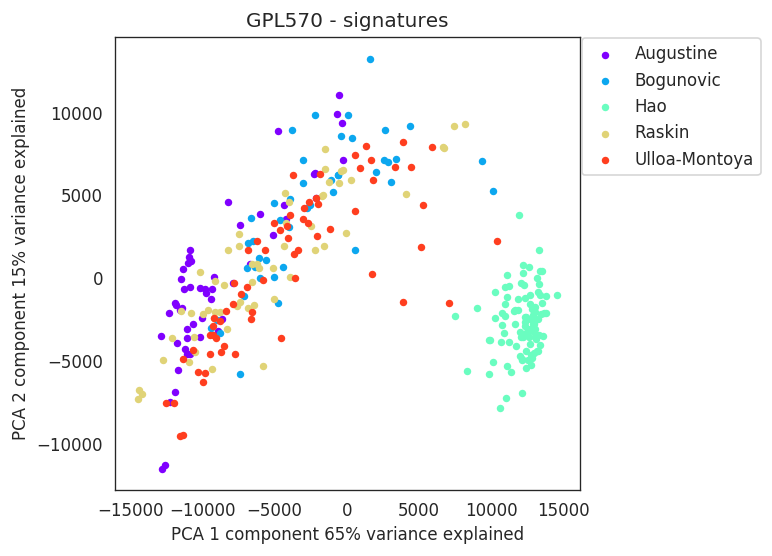

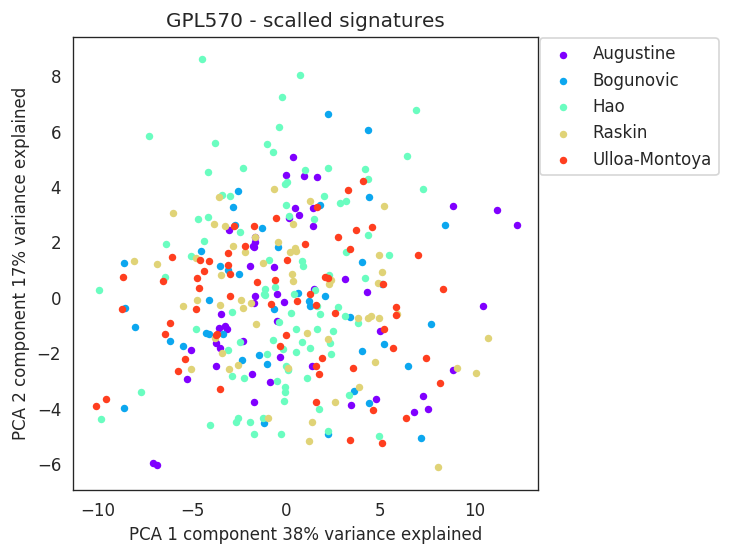

In [157]:
pca_plot(cgenes, cann.Cohort, palette=coh_p, title=f'{cplatform} - genes', legend='out')
pca_plot(csigns, cann.Cohort, palette=coh_p, title=f'{cplatform} - signatures', legend='out')
pca_plot(csigns_sc, cann.Cohort, palette=coh_p, title=f'{cplatform} - scalled signatures', legend='out')

## RNAseq batch

### Assign batches

Checking batch effects for all the re-calculated RAN-seq samples from raw fastq cohorts

In [158]:
cplatform = 'RNAseqBG'

In [159]:
cann = pan_ann_f[pan_ann_f.platform_id==cplatform]
cgenes = pd.concat([dm_genes_dst[cds] for cds in cann.Cohort.unique()])

cann, cgenes = to_common_samples([cann, cgenes])

csigns = ssgsea_formula(cgenes, immuno_gmt)

# signatures scalled as is
csigns_sc = median_scale(csigns, 4)

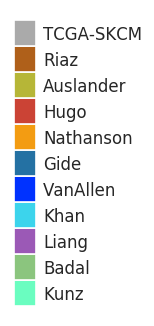

In [160]:
coh_p = {
 'Auslander': '#B6B637',
 'Hugo': '#CB4335',
 'Nathanson': '#F39C12', 
 'Riaz': '#AF601A',
 'TCGA-SKCM': lgrey_color,
    
 'Liang': '#9B59B6',
    
 'VanAllen': '#0032FF',
 'Gide': '#2471A3',
 'Khan': '#3CD4EC',
    
 'Badal': '#8BC57E',
         
 'Kunz': '#6afdc0',}
coh_o = ['TCGA-SKCM', 'Riaz', 'Auslander', 'Hugo', 'Nathanson',
 'Gide', 'VanAllen', 'Khan', 
 'Liang',
 'Badal', 
 'Kunz']
patch_plot(coh_p, order=coh_o)

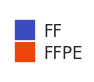

In [161]:
storage_p = {'FF': blue_color,
             'FFPE': orange_color}
patch_plot(storage_p)

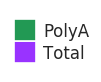

In [162]:
rnae_p = {'PolyA': green_color, 
          'Total': purple_color}
patch_plot(rnae_p)

Let's compare all the cohorts to the biggest one - TCGA-SKCM (grey dots)

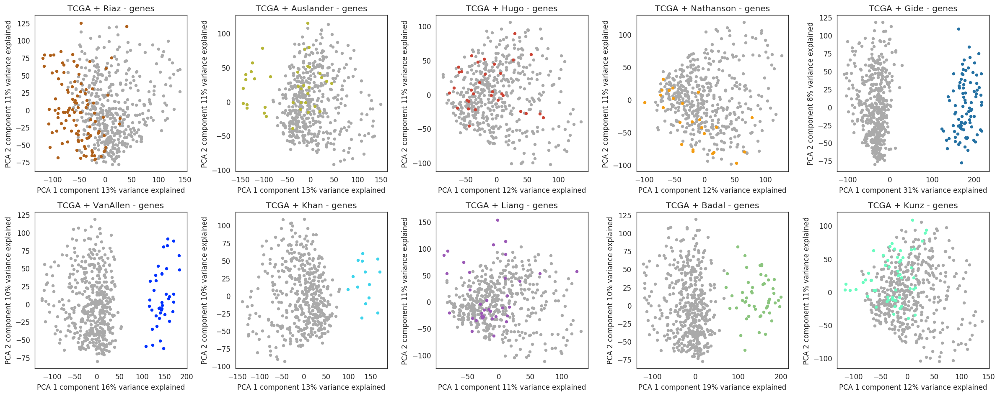

In [163]:
af = axis_net(5, 2,)
for cc in ['Riaz',
 'Auslander',
 'Hugo',
 'Nathanson',
 'Gide',
 'VanAllen',
 'Khan',
 'Liang',
 'Badal',
 'Kunz']:
    
    sub_ann = cann.Cohort[cann.Cohort.isin(['TCGA-SKCM', cc])]

    pca_plot(cgenes, sub_ann, ax=next(af), palette=coh_p, order=coh_o, title=f'TCGA + {cc} - genes', legend=False)
    
plt.tight_layout()
plt.show()

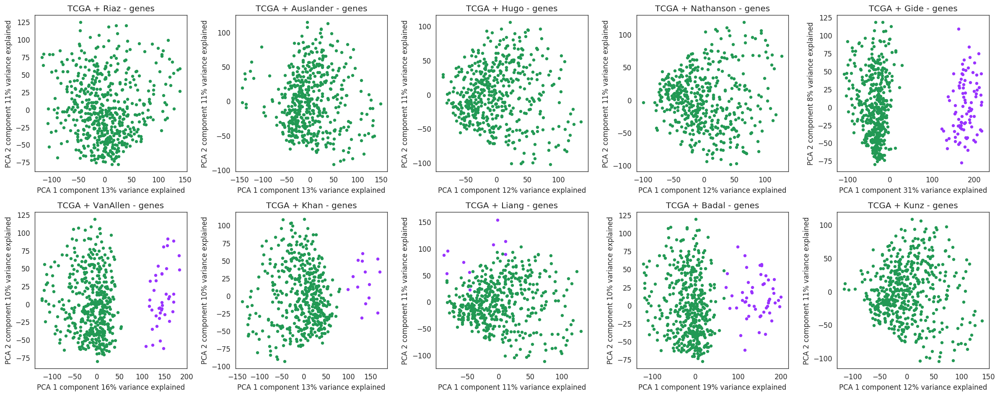

In [164]:
af = axis_net(5, 2,)
for cc in ['Riaz',
 'Auslander',
 'Hugo',
 'Nathanson',
 'Gide',
 'VanAllen',
 'Khan',
 'Liang',
 'Badal',
 'Kunz']:
    
    sub_ann = cann.Rna_Enrichment[cann.Cohort.isin(['TCGA-SKCM', cc])]

    pca_plot(cgenes, sub_ann, ax=next(af), palette=rnae_p, title=f'TCGA + {cc} - genes', legend=False)
    
plt.tight_layout()
plt.show()

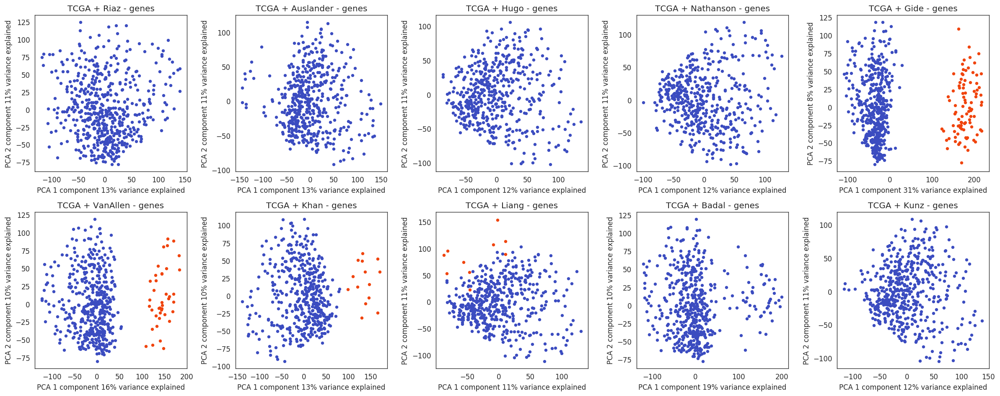

In [165]:
af = axis_net(5, 2,)
for cc in ['Riaz',
 'Auslander',
 'Hugo',
 'Nathanson',
 'Gide',
 'VanAllen',
 'Khan',
 'Liang',
 'Badal',
 'Kunz']:
    
    sub_ann = cann.Storage_method[cann.Cohort.isin(['TCGA-SKCM', cc])]

    pca_plot(cgenes, sub_ann, ax=next(af), palette=storage_p, title=f'TCGA + {cc} - genes', legend=False)
    
plt.tight_layout()
plt.show()

Found groups: <br>
FF+PolyA: TCGA-SKCM, Hugo, Nathanson, Kunz, Liang-FF, Riaz, Auslander<br>
FFPE+Total: Gide, VanAllen, Khan, Liang-FFPE<br>
FF+Total: Badal

The Riaz and Auslander cohorts share the same protocol with TCGA, but have much more batch effects than the other cohorts (Nathanson, Hugo, Kunz, Liang-FF)


## Fresh Frozen and PolyA RNA-seq batch

In [166]:
cenrm = 'PolyA'
cstorem = 'FF'

In [167]:
cann = pan_ann_f[(pan_ann_f.platform_id==cplatform) & 
                 (pan_ann_f.Rna_Enrichment==cenrm) & 
                 (pan_ann_f.Storage_method==cstorem)]
cgenes = pd.concat([dm_genes_dst[cds] for cds in cann.Cohort.unique()])

cann, cgenes = to_common_samples([cann, cgenes])

csigns = ssgsea_formula(cgenes, immuno_gmt)

# signatures scalled as is
csigns_sc = median_scale(csigns, 4)

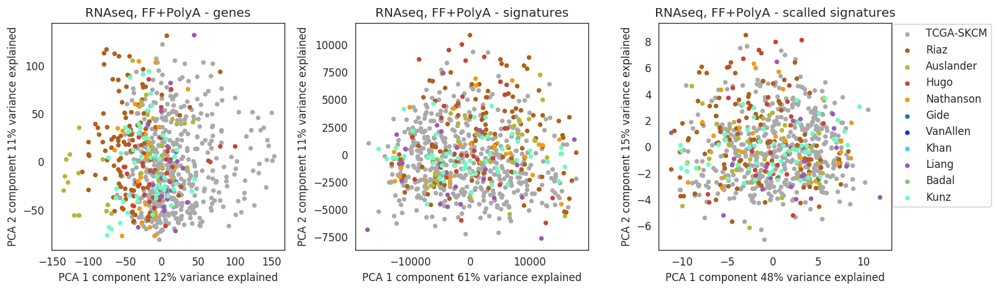

In [168]:
af = axis_net(3, 1, x_len=4.5)

pca_plot(cgenes, cann.Cohort, ax=next(af), palette=coh_p, order=coh_o, title=f'RNAseq, {cstorem}+{cenrm} - genes', legend=False)
pca_plot(csigns, cann.Cohort, ax=next(af), palette=coh_p, order=coh_o, title=f'RNAseq, {cstorem}+{cenrm} - signatures', legend=False)
pca_plot(csigns_sc, cann.Cohort, ax=next(af), palette=coh_p, order=coh_o, title=f'RNAseq, {cstorem}+{cenrm} - scalled signatures', legend='out')

plt.tight_layout()
plt.show()

There is no batch effect in the signature space. We will combine all the cohorts for scaling.

## FFPE + Total RNA-seq batch

In [169]:
cann = pan_ann_f[(pan_ann_f.platform_id=='RNAseqBG') & 
                 (pan_ann_f.Rna_Enrichment=='Total') & 
                 (pan_ann_f.Storage_method=='FFPE')]
cgenes = pd.concat([dm_genes_dst[cds] for cds in cann.Cohort.unique()])

cann, cgenes = to_common_samples([cann, cgenes])

csigns = ssgsea_formula(cgenes, immuno_gmt)

# signatures scalled by cohort
csigns_sc = pd.concat([median_scale(csigns.loc[samps.index], 4) for cb, samps in cann.groupby('Cohort_group')])

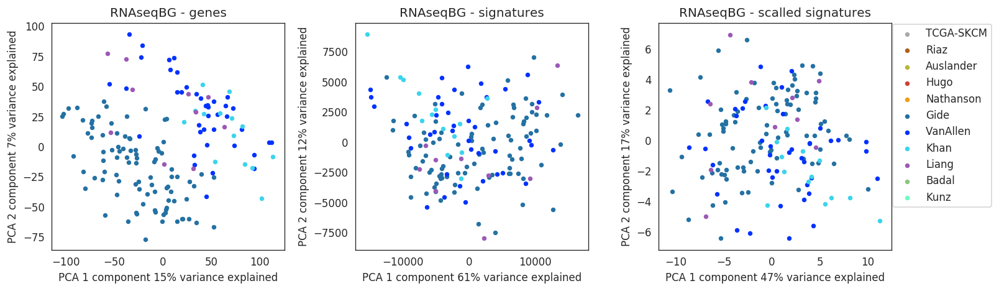

In [170]:
af = axis_net(3, 1, x_len=4.5)

pca_plot(cgenes, cann.Cohort, ax=next(af), palette=coh_p, order=coh_o, title=f'{cplatform} - genes', legend=False)
pca_plot(csigns, cann.Cohort, ax=next(af), palette=coh_p, order=coh_o, title=f'{cplatform} - signatures', legend=False)
pca_plot(csigns_sc, cann.Cohort, ax=next(af), palette=coh_p, order=coh_o, title=f'{cplatform} - scalled signatures', legend='out')

plt.tight_layout()
plt.show()

In the signature space, all cohorts are mixed together except for Khan et al. because the Khan cohort consists of brain metastasis, which would suggest an altered TME and expression batch effects due to biopsy type but not a technical problems; therefore, we combined all cohorts for scaling 

We combined all the cohorts for scaling

# Analysis of All RNAseq samples together

In [171]:
cplatform = 'RNAseqBG'

In [172]:
cann = pan_ann_f[pan_ann_f.platform_id==cplatform]
cgenes = pd.concat([dm_genes_dst[cds] for cds in cann.Cohort.unique()])

cann, cgenes = to_common_samples([cann, cgenes])

csigns = ssgsea_formula(cgenes, immuno_gmt)

# signatures scalled by batch
csigns_sc = pd.concat([median_scale(csigns.loc[samps.index], 4) for cb, samps in cann.groupby('Cohort_group')])

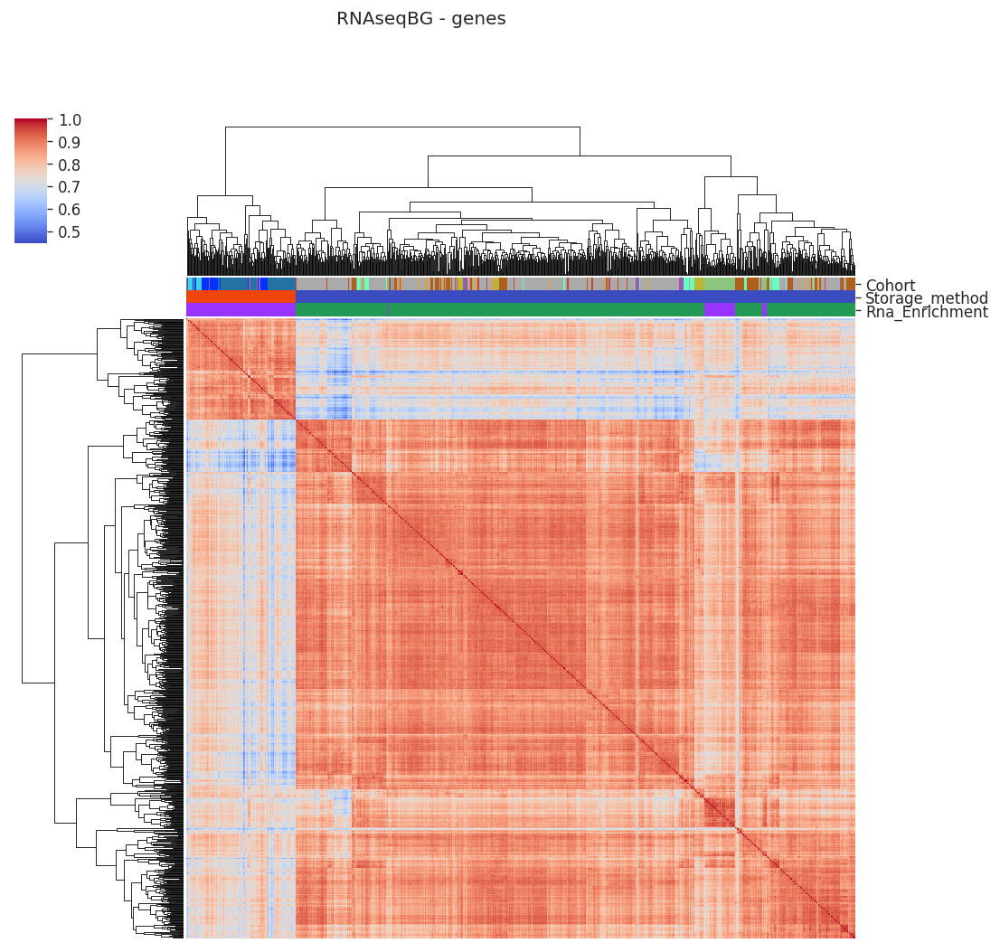

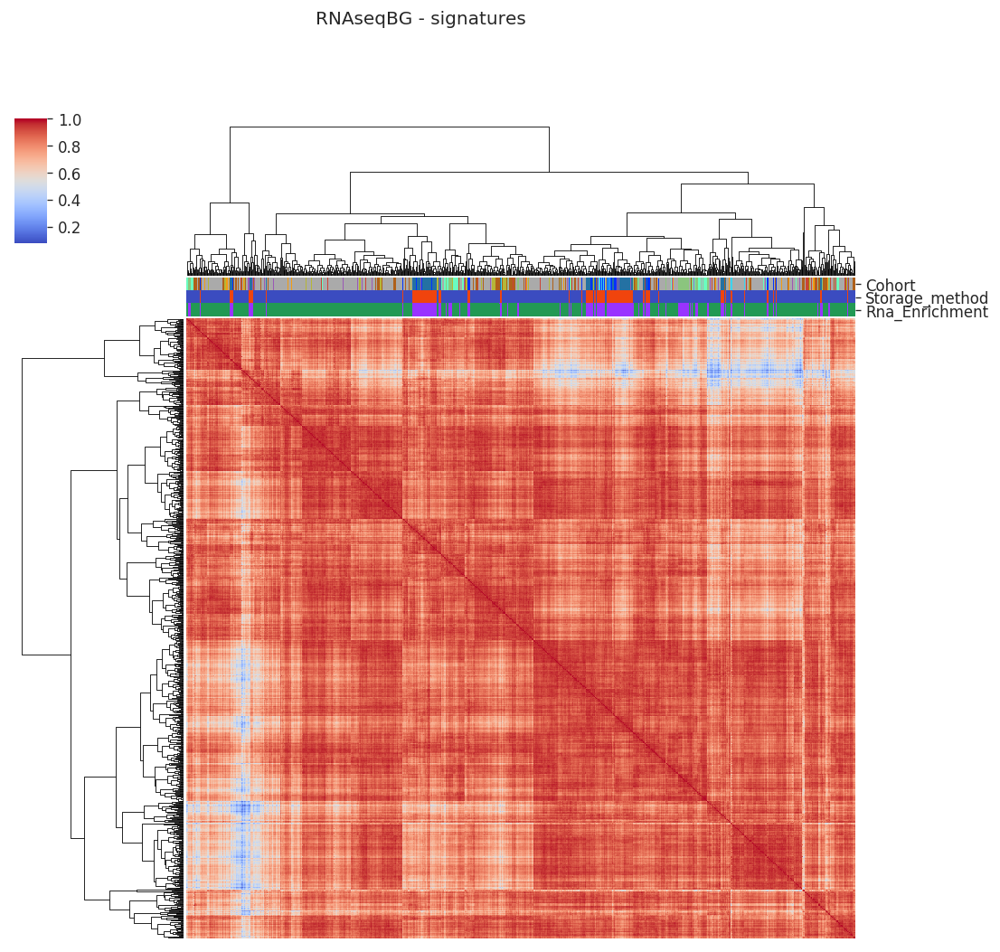

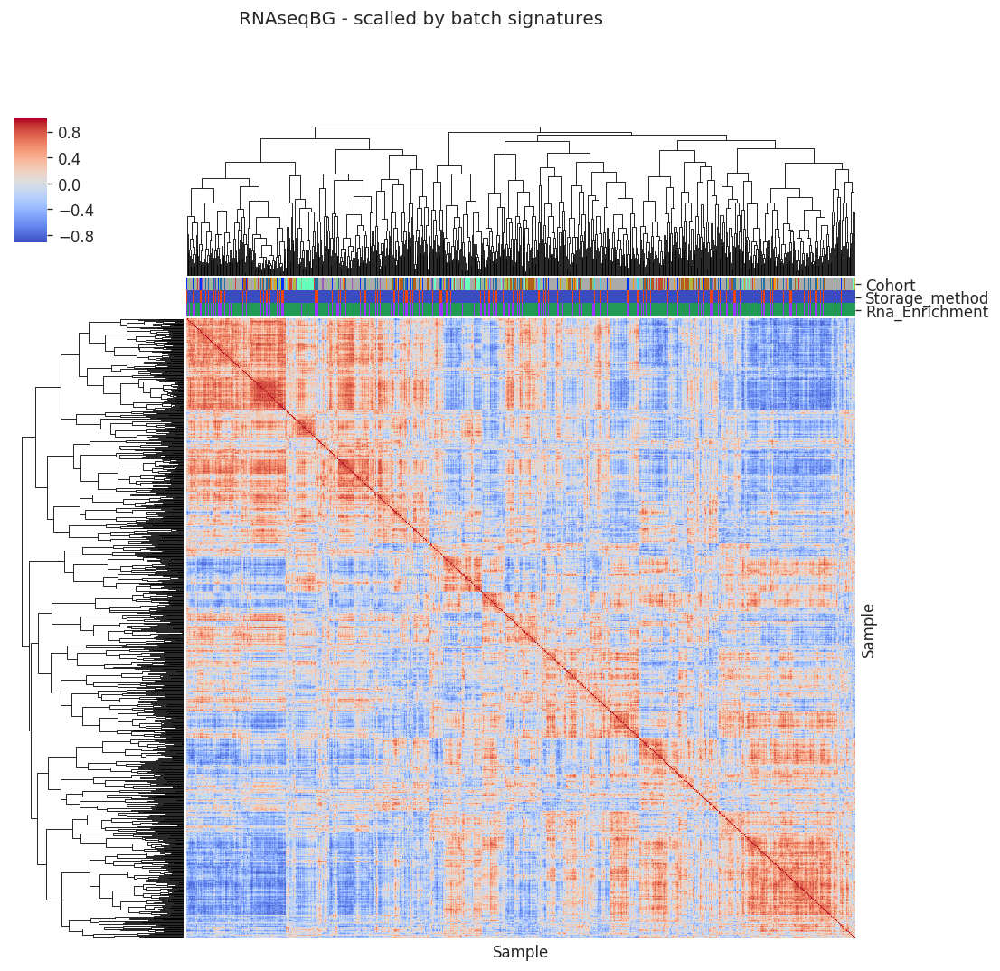

In [173]:
g = clustering_heatmap(cgenes, col_colors=pd.concat([cann.Cohort.map(coh_p), 
                                                     cann.Storage_method.map(storage_p), 
                                                     cann.Rna_Enrichment.map(rnae_p)], axis=1), 
                   xl=False, yl=False, title=f'{cplatform} - genes')
plt.show()
g = clustering_heatmap(csigns, col_colors=pd.concat([cann.Cohort.map(coh_p), 
                                                     cann.Storage_method.map(storage_p), 
                                                     cann.Rna_Enrichment.map(rnae_p)], axis=1), 
                   xl=False, yl=False, title=f'{cplatform} - signatures')
plt.show()
g = clustering_heatmap(csigns_sc, col_colors=pd.concat([cann.Cohort.map(coh_p), 
                                                     cann.Storage_method.map(storage_p), 
                                                     cann.Rna_Enrichment.map(rnae_p)], axis=1),
                   xl=False, yl=False, title=f'{cplatform} - scalled by batch signatures')
plt.show()

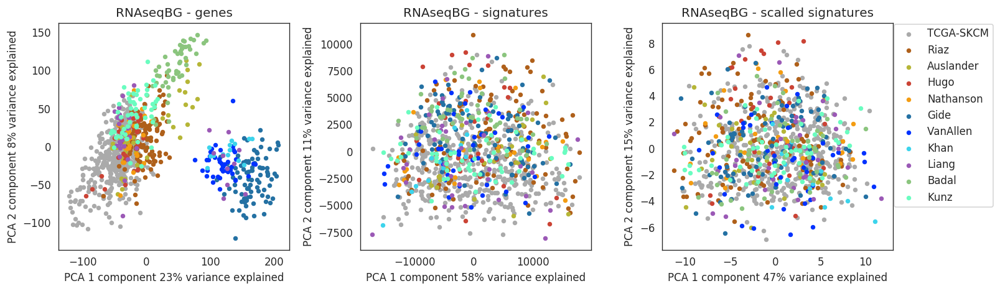

In [174]:
af = axis_net(3, 1, x_len=4.5)

pca_plot(cgenes, cann.Cohort, ax=next(af), palette=coh_p, order=coh_o, title=f'{cplatform} - genes', legend=False)
pca_plot(csigns, cann.Cohort, ax=next(af), palette=coh_p, order=coh_o, title=f'{cplatform} - signatures', legend=False)
pca_plot(csigns_sc, cann.Cohort, ax=next(af), palette=coh_p, order=coh_o, title=f'{cplatform} - scalled signatures', legend='out')

plt.tight_layout()
plt.show()

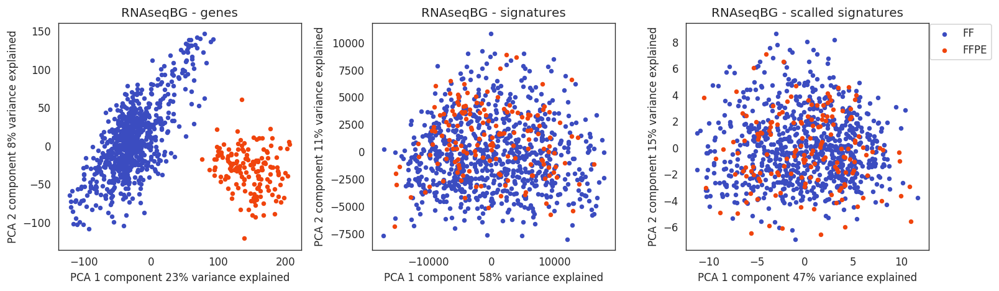

In [175]:
af = axis_net(3, 1, x_len=4.5)

pca_plot(cgenes, cann.Storage_method,  ax=next(af), palette=storage_p, title=f'{cplatform} - genes', legend=False)
pca_plot(csigns, cann.Storage_method,  ax=next(af), palette=storage_p, title=f'{cplatform} - signatures', legend=False)
pca_plot(csigns_sc, cann.Storage_method,  ax=next(af), palette=storage_p, title=f'{cplatform} - scalled signatures', legend='out')


plt.tight_layout()
plt.show()

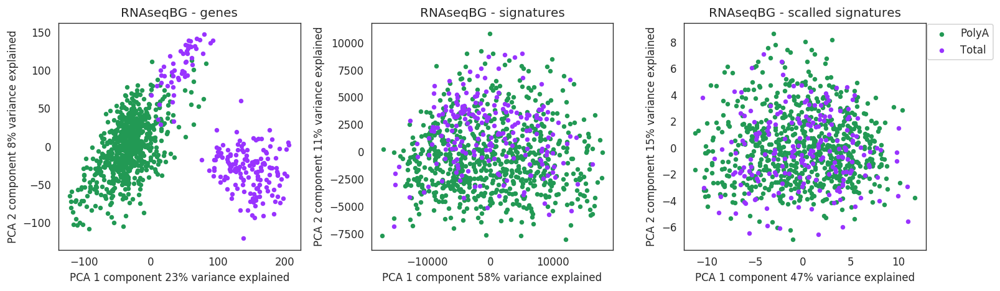

In [176]:
af = axis_net(3, 1, x_len=4.5)

pca_plot(cgenes, cann.Rna_Enrichment,  ax=next(af), palette=rnae_p, title=f'{cplatform} - genes', legend=False)
pca_plot(csigns, cann.Rna_Enrichment,  ax=next(af), palette=rnae_p, title=f'{cplatform} - signatures', legend=False)
pca_plot(csigns_sc, cann.Rna_Enrichment,  ax=next(af), palette=rnae_p, title=f'{cplatform} - scalled signatures', legend='out')


plt.tight_layout()
plt.show()

# Perform gene signatures median scaling within a batch group for all cohorts

Gene signature median scaling removes differences between batch groups allowing analysis of the gene signature expression values as low or high.

In [177]:
dm_cohort_groups = list(pan_ann.Cohort_group.value_counts().index)
len(dm_cohort_groups)

16

Process all cohorts. Calculate signature values and median-transform by Cohort_group

In [194]:
dm_genes_cg_dst = {}
dm_raw_signatures_dst = {}
dm_signatures_sc_dst = {}

for cds in tqdm_notebook(dm_cohort_groups):
    cann = pan_ann[(pan_ann.Cohort_group==cds) & (pan_ann.QC.isna()) & (pan_ann.Diagnosis!='Nevus')]
    cgenes = pd.concat([dm_genes_dst[choh].loc[samps.index].dropna() for choh, samps in cann.groupby('Cohort')]).dropna(axis=1)

    cann, cgenes = to_common_samples([cann, cgenes])
    
    c_signs = ssgsea_formula(cgenes, immuno_gmt)[signatures_order]
    
    c_signs_sc = median_scale(c_signs, 4)
    
    dm_genes_cg_dst[cds] = cgenes
    dm_raw_signatures_dst[cds] = c_signs
    dm_signatures_sc_dst[cds] = c_signs_sc
    print(cds, cann.shape, cgenes.shape, c_signs_sc.shape)

RNAseqPa (743, 146) (743, 20062) (743, 29)
GPL10558_1 (214, 146) (214, 20692) (214, 29)
RNAseqT_FFPE (155, 146) (155, 20062) (155, 29)
GPL8432 (126, 146) (126, 18402) (126, 29)
RNAseqT_FFPE_2 (115, 146) (115, 16942) (115, 29)
GPL570_3 (94, 146) (94, 24442) (94, 29)
GPL6884 (85, 146) (85, 19138) (85, 29)
GPL96_1 (83, 146) (83, 13394) (83, 29)
RNAseqTotal2 (51, 146) (51, 20062) (51, 29)
GPL570_2 (65, 146) (65, 24442) (65, 29)
GPL570_4 (57, 146) (57, 24442) (57, 29)
GPL6102_1 (56, 146) (56, 18142) (56, 29)
GPL570_1 (52, 146) (52, 24442) (52, 29)
GPL570_5 (44, 146) (44, 24442) (44, 29)
GPL10558_2 (27, 146) (27, 20692) (27, 29)
RNAseqPa_3 (25, 146) (25, 18418) (25, 29)



By combining all genes from all cohorts, we will lose a lot of genes; however, here, we are showing batch effects before normalization (I am unclear if this is what you mean)

In [195]:
all_samples_genes = pd.concat(dm_genes_cg_dst.values()).dropna(axis=1)
all_samples_genes.shape

(1992, 10051)

In [196]:
all_samples_raw_signatures = pd.concat(dm_raw_signatures_dst.values())
all_samples_raw_signatures.shape

(1992, 29)

In [197]:
all_samples_sc_signatures = pd.concat(dm_signatures_sc_dst.values())
all_samples_sc_signatures.shape

(1992, 29)

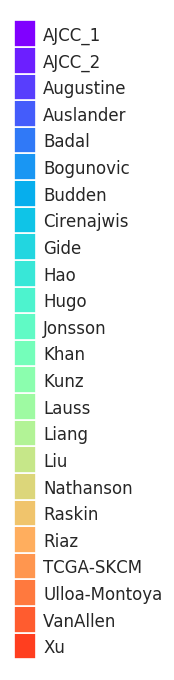

In [198]:
coh_p = lin_colors(pan_ann.Cohort)
patch_plot(coh_p)

Visualizing gene expression signatures on the PCA plot before and after scaling

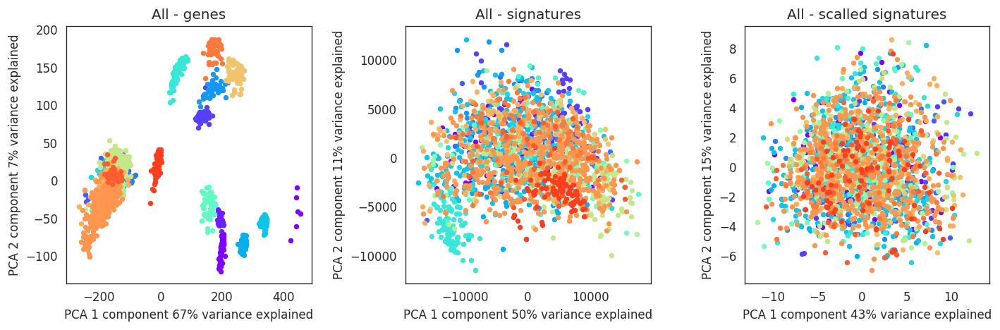

In [200]:
af = axis_net(3, 1)

pca_plot(all_samples_genes, pan_ann.Cohort, ax=next(af), palette=coh_p, title=f'All - genes', legend=False)
pca_plot(all_samples_raw_signatures, pan_ann.Cohort, ax=next(af), palette=coh_p, title=f'All - signatures', legend=False)
pca_plot(all_samples_sc_signatures, pan_ann.Cohort, ax=next(af), palette=coh_p, title=f'All - scalled signatures', legend=False)

plt.tight_layout()
plt.show()

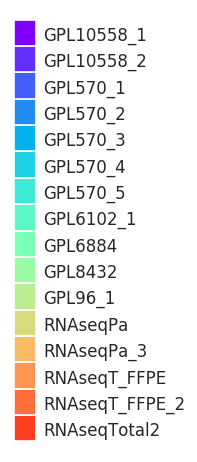

In [199]:
coh_g_p = lin_colors(pan_ann.Cohort_group)
patch_plot(coh_g_p)

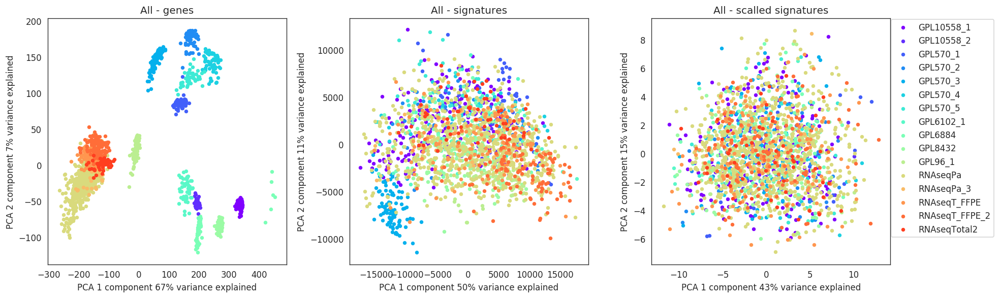

In [201]:
af = axis_net(3, 1, x_len=5.5, y_len=5)

pca_plot(all_samples_genes, pan_ann.Cohort_group, palette=coh_g_p, ax=next(af), title=f'All - genes', legend=False)
pca_plot(all_samples_raw_signatures, pan_ann.Cohort_group, palette=coh_g_p, ax=next(af), title=f'All - signatures', legend=False)
pca_plot(all_samples_sc_signatures, pan_ann.Cohort_group, palette=coh_g_p, ax=next(af), title=f'All - scalled signatures', legend='out')

plt.tight_layout()
plt.show()

# Visualizing gene signatures distribution before and after median scaling

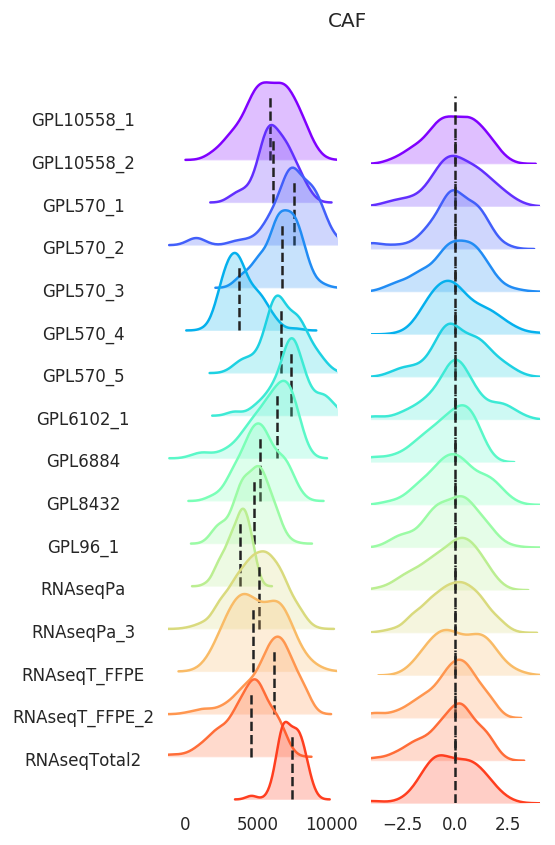

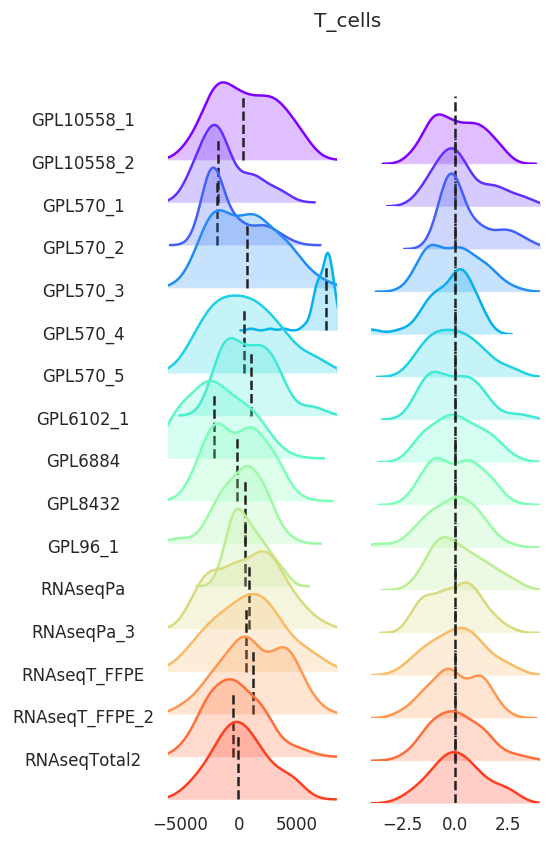

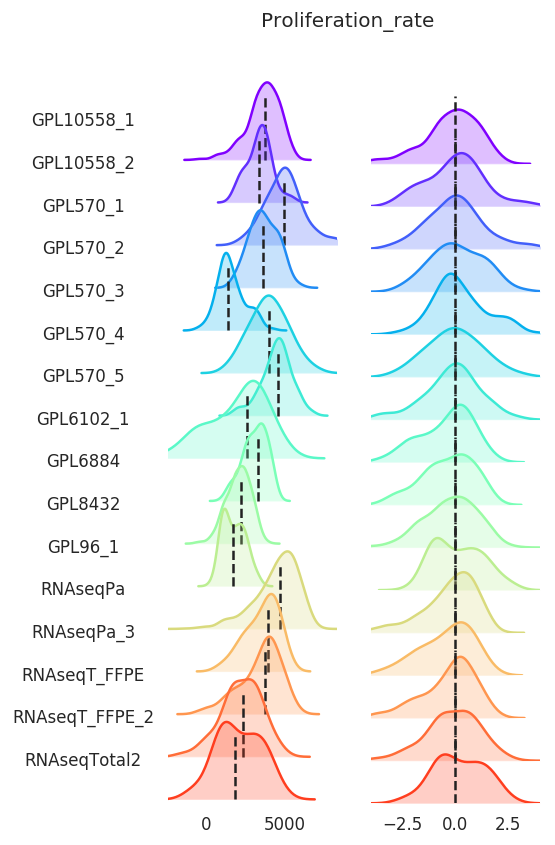

In [191]:
for cproc in ['CAF', 'T_cells', 'Proliferation_rate']:
    us = sorted(pan_ann.Cohort_group.unique())
    af = axis_net(2, len(us), x_len=2, y_len=.5, title=cproc, title_y=.95)
    xlims = [all_samples_raw_signatures[cproc].min(),all_samples_raw_signatures[cproc].max()]
    for cp in us:
        samps = pan_ann[pan_ann.Cohort_group.astype(str)==cp]

        sign = dm_raw_signatures_dst[cp][cproc]

        ax = next(af)

        sns.kdeplot(sign, ax=ax, shade=True, legend=False, color=coh_g_p[cp], )

        ax.grid(False)
        ax.patch.set_alpha(.0)

        ax.yaxis.set_label_coords(-0.5, .4)

        # check that all plots in the column have the same y and x limits
#         ax.set_ylim(0, .5) 
        ax.set_xlim(*xlims)

        # hide all spines and ticklabels
        ax.spines['top'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.set_yticklabels([])
        ax.set_ylabel(cp, rotation=0, )
        ax.plot([sign.median()]*2, [.8*x for x in ax.get_ylim()], 'k--', color='#222222')

        if cp != us[-1]:
            ax.set_xticklabels([])


        sign = dm_signatures_sc_dst[cp][cproc]

        ax = next(af)

        sns.kdeplot(sign, ax=ax, shade=True, legend=False, color=coh_g_p[cp])

        ax.grid(False)
        ax.patch.set_alpha(.0)

        ax.yaxis.set_label_coords(-0.1, .1)

        # check that all plots in the column have the same y and x limits
        ax.set_ylim(0, .5) 
        ax.set_xlim(-4, 4)

        # hide all spines and ticklabels
        ax.spines['top'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.set_yticklabels([])
        ax.plot([sign.median()]*2, [.8*x for x in ax.get_ylim()], 'k--', color='#222222')

        if cp != us[-1]:
            ax.set_xticklabels([])

    plt.subplots_adjust(hspace=-.5, wspace=.2)